This is a working notebook to think about how to deal with overlaps, both within city shapefiles and when merging the cities with census tracts.

In [2]:
import geopandas as gpd
import contextily as cx
import warnings
import pandas as pd
import math
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
import os
import sys
sys.path[0] = os.path.join(os.path.abspath(''),'..')
import data_pipeline.spatial_operations as so
from shapely.geometry import Polygon, MultiPolygon

In [3]:
FIPS_CODES = {"ALABAMA": "01", "ALASKA": "02", "ARIZONA": "04", "ARKANSAS": "05", "CALIFORNIA": "06", 
              "COLORADO": "08", "CONNECTICUT": "09", "DELAWARE": "10", "DISTRICT OF COLUMBIA": "11", 
              "FLORIDA": "12", "GEORGIA": "13", "HAWAII": "15", "IDAHO": "16", "ILLINOIS": "17", "INDIANA": "18", 
              "IOWA": "19", "KANSAS": "20", "KENTUCKY": "21", "LOUISIANA": "22", "MAINE": "23", "MARYLAND": "24", 
              "MASSACHUSETTS": "25", "MICHIGAN": "26", "MINNESOTA": "27", "MISSISSIPPI": "28", "MISSOURI": "29", 
              "MONTANA": "30", "NEBRASKA": "31", "NEVADA": "32", "NEW HAMPSHIRE": "33", "NEW JERSEY": "34", 
              "NEW MEXICO": "35", "NEW YORK": "36", "NORTH CAROLINA": "37", "NORTH DAKOTA": "38", "OHIO": "39", 
              "OKLAHOMA": "40", "OREGON": "41", "PENNSYLVANIA": "42", "PUERTO RICO": "72", "RHODE ISLAND": "44", 
              "SOUTH CAROLINA": "45", "SOUTH DAKOTA": "46", "TENNESSEE": "47", "TEXAS": "48", "UTAH": "49", 
              "VERMONT": "50", "VIRGINIA": "51", "VIRGIN ISLANDS": "78", "WASHINGTON": "53", "WEST VIRGINIA": "54", 
              "WISCONSIN": "55", "WYOMING": "56", "AL": "01", "AK": "02", "AZ": "04", "AR": "05", "CA": "06", 
              "CO": "08", "CT": "09", "DE": "10", "DC": "11", "FL": "12", "GA": "13", "HI": "15", "ID": "16", 
              "IL": "17", "IN": "18", "IA": "19", "KS": "20", "KY": "21", "LA": "22", "ME": "23", "MD": "24", 
              "MA": "25", "MI": "26", "MN": "27", "MS": "28", "MO": "29", "MT": "30", "NE": "31", "NV": "32", 
              "NH": "33", "NJ": "34", "NM": "35", "NY": "36", "NC": "37", "ND": "38", "OH": "39", "OK": "40", 
              "OR": "41", "PA": "42", "PR": "72", "RI": "44", "SC": "45", "SD": "46", "TN": "47", "TX": "48", 
              "UT": "49", "VT": "50", "VA": "51", "VI": "78", "WA": "53", "WV": "54", "WI": "55", "WY": "56"}

The main thrust of this notebook is trying to figure out how to deal with census tracts that overlap multiple neighborhoods. I wanted to remove the tracts that shouldn't be included: those outside the city and those that only minorly overlap. There are still tracts included multiple times if they purposefully cross over multiple neighborhoods, which is a separate issue I was not able to look into further.

The function that follows here is an exploratory function. In a sense, it resembles hyperparameter testing in ML. It is meant to see what happens under various thresholds for when to remove or include a census tract. The idea was that after looking at the numbers and/or maps for each city we would be able to figure out one best threshold for every city, and the filtering stage could then be incorporated in the data pipeline. That was an unrealistic expectation; some cities needed much higher thresholds than others. However, the function here could still be used to determine the best threshold to use per city.

In [138]:
def thresholds(city, id_col, percent_thresholds, state=None, map=True):
    """
    Tests statistics for when tracts are included for neighborhoods when only a certain percentage of the tract is
    within the neighborhood. Prints a number of statistics:
        # neighborhoods before and after removing tracts, neighborhood loss
        # unique tracts before and after removing tracts
        # total tracts after (including double-counted)
        tract multiple, how many extra tracks are included
        summed area of neighborhoods
        summed area of tracts including double-counted, excluding double-counted, and overlapping neighborhoods
        ratios of those areas to neighborhood area        
    
    Inputs
        city: the city data, GeoDataFrame
        id_col: identity column (eg neighborhood name or id number), str
        percent_thresholds: thresholds to test, list of ints
        state: name or postal abbreviation for state that the city is in, str. Optional but allows for faster joining of census tracts.
        map: create maps or not? Bool
    Returns
        list of lists in the following format:
        ['Threshold', ('Lost Nbhd/Total', 'Tract Multiple', '% Area Loss')]
    """
    return_list = []
    
    if state:
        code = FIPS_CODES[state.upper()]
        tracts = fcc_df[fcc_df.geoid.str.startswith(code)]
    else:
        tracts = fcc_df
    
    transformed = city.to_crs(epsg=4326, inplace=False)
    unq_nbhd_bef = len(np.unique(transformed[id_col]))
    
    dissolved = transformed.dissolve()
    clipped = tracts.clip(dissolved)
    unq_tct_bef = len(np.unique(clipped['geoid']))
    nbhd_area = np.round(dissolved.to_crs(epsg=5070).area.array[0]/10e6, 4)

    merged = gpd.sjoin(tracts, transformed, how="inner", op='intersects')
    overlay = tracts.overlay(transformed)
    overlay["overlap_area"] = overlay.to_crs(epsg=5070).area/10e6
    merged = merged.merge(overlay[['geoid', id_col, 'overlap_area']])
    merged["percent_area"] = merged["overlap_area"]/merged["total_area"]*100
    
    for p_t in percent_thresholds:
        filtered = merged[merged.percent_area >= p_t]
        unq_nbhd_af = len(np.unique(filtered[id_col]))
        unq_tct_af = len(np.unique(filtered['geoid']))
        tot_tct_af = len(filtered)
        filtered_area = np.round(filtered.dissolve().to_crs(epsg=5070).area.array[0]/10e6, 4)
        overlapping_area = np.round(np.sum(filtered.overlap_area), 4)
        total_area = np.round(np.sum(filtered.to_crs(epsg=5070).area/10e6), 4)
        
        output_str = f"""Threshold: {p_t}
    Neighborhoods before & after: {unq_nbhd_bef}/{unq_nbhd_af}
               Neighborhood Loss: {unq_nbhd_bef - unq_nbhd_af}
    Unique Tracts before & after: {unq_tct_bef}/{unq_tct_af}
              Total Tracts after: {tot_tct_af}
                  Tract Multiple: {np.round(tot_tct_af/unq_tct_af, 4)}
               Neighborhood Area: {nbhd_area}
          Overlapping Tract Area: {overlapping_area}
          Overlapping Area Ratio: {np.round(overlapping_area/nbhd_area, 4)}
        All Filtered Tracts Area: {filtered_area}
             Filtered Area Ratio: {np.round(filtered_area/nbhd_area, 4)}
     Total (double-counted) Area: {total_area}
            Dissolved Area Ratio: {np.round(total_area/nbhd_area, 4)}"""
        
        print(output_str)
        if unq_nbhd_af == 0:
            print('Missing neighborhoods: all')
        elif unq_nbhd_af < unq_nbhd_bef:
            print('Missing neighborhoods: ', np.setdiff1d(np.unique(city[id_col]), np.unique(filtered[id_col])), '\n')
        
        if map:
            f, ax = plt.subplots(figsize=(12, 12))
            filtered.drop_duplicates(subset='geometry').plot(ax=ax, color='lightcoral', alpha=0.4, edgecolor='k')
            transformed.plot(ax=ax, color='lightblue', alpha=0.4, edgecolor='grey', linestyle='dashed')
            tract_color = mpatches.Patch(facecolor='lightcoral', alpha=0.4, label='Tracts', edgecolor='k')
            nbhd_color = mpatches.Patch(facecolor='lightblue', alpha=0.4, label='Neighborhoods', edgecolor='grey')
            overlap_color = mpatches.Patch(color='#ceacb3', alpha=0.64, label='Overlap')
            ax.legend(handles=[tract_color, nbhd_color, overlap_color], title=f'Threshold {p_t}%', loc='upper left', frameon=False)
        
        return_list.append([p_t,
                            (f'{unq_nbhd_bef - unq_nbhd_af}/{unq_nbhd_bef}',
                            tot_tct_af/unq_tct_af,
                            (1 - filtered_area/nbhd_area)*100)])
    return return_list

The next function was used to clean up the city shapefiles/dataframes where they had overlaps. It works automatically for small enough overlaps and prints information for larger overlaps so that you can check manually if it should be included. (This can be seen later down where I used a higher threshold for Detroit after confirming on the map.)

In [5]:
def remove_overlaps(city_df, id_col, threshold=1e-4, print_info=False):
    """
    Cleans overlaps between polygons of the same dataframe. For overlapping areas below a percent area threshold,
    keeps that area in the polygon of which it is the larger percent and removes from the other. If the area is
    larger than the threshold for either polygon, does not remove and prints information.
    
    Inputs
        city_df: the city data, GeoDataFrame
        col: identity column (eg neighborhood name or id number), str
        threshold: how large an overlap to remove, real
        print_info: display the neighborhoods and percent overlaps at each step? Bool
    Returns
        cleaned GeoDataFrame
    """
    intersected = city_df.overlay(city_df, how='intersection').query(f'{id_col}_1 != {id_col}_2')
    return_df = city_df.copy()
    for i, r in intersected.iterrows():
        nh_1_name = r[f'{id_col}_1']
        nh_1 = city_df[city_df[id_col] == nh_1_name]
        nh_2_name = r[f'{id_col}_2']
        nh_2 = city_df[city_df[id_col] == nh_2_name]
        overlap_ar = r.geometry.area
        nh_1_ar = nh_1.area.item()
        nh_2_ar = nh_2.area.item()
        nh_1_pct = overlap_ar/nh_1_ar
        nh_2_pct = overlap_ar/nh_2_ar
        if print_info:
            print(f'    Row {i}: {nh_1_name} & {nh_2_name}\n    {nh_1_pct} & {nh_2_pct}')            
        if nh_1_pct > threshold or nh_2_pct > threshold:
            print(f'Overlap in {nh_1_name} and {nh_2_name}: larger than {threshold*100}%')
        elif nh_1_pct > nh_2_pct:
            rows_to_change = (return_df[id_col] == nh_2_name)
            return_df.loc[rows_to_change] = return_df.loc[rows_to_change].set_geometry(return_df.loc[rows_to_change].geometry - r.geometry)
        else:
            rows_to_change = (return_df[id_col] == nh_1_name)
            return_df.loc[rows_to_change] = return_df.loc[rows_to_change].set_geometry(return_df.loc[rows_to_change].geometry - r.geometry)
    return return_df
            
            

These are utility functions to help the main two.

In [6]:
def read_wrapper(city, file_path):
    """
    Inputs
        city: city name, str
        file_path: file path for read_file, str
    Returns
        GPD GeoDataFrame of city
        
    This function was just to read a city and print the first few rows together.
    It was used in the beginning when I needed to know the structure of each city dataframe but then became superfluous.
    """
    file = gpd.read_file(file_path)
    print(city, '\n', file.head(2), '\n')
    return file

def check_overlaps(file, city, col):
    """
    Tests a geodataframe for overlaps between its own records. Prints results.
    
    Inputs
        file: the city data, GeoDataFrame
        city: city name, str
        col: identity column (eg neighborhood name or id number), str
    Returns
        none
    """
    self_overlay = file.overlay(file)
    n_overlaps = len(self_overlay[self_overlay[col+'_1'] != self_overlay[col+'_2']])//2
    if n_overlaps > 0:
        print(f'Warning: {city} has {n_overlaps} overlaps.')
    else:
        print(f'         {city} has no overlaps.')
        
def threshold_wrapper(city, results, threshold_list):
    """
    Runs thresholds function and allows for easy changes to the thresholds tests. Adds results to a dictionary.
    
    Inputs
        city: a list/tuple representing the city
            expects [file (gdf), name (str), id column (str), state or state abbreviation (str)]
        results: where to put the results, dict
        threshold_list: list of values to test as a threshold, list of ints
    Returns
        none
    """
    print(city[1])
    results[city[1]] = thresholds(city[0], city[2], threshold_list, state=city[3])

In [7]:
fcc_df = gpd.read_file("../internet-access-map/data/broadband.geojson")

In [8]:
fcc_df['total_area'] = fcc_df['geometry'].to_crs(epsg=5070).area/10e6

In [9]:
austin = gpd.read_file("../neighborhood-data/austin/Neighborhoods/geo_export_81d98617-c469-49e1-9bf6-3ef25c07d0c6.shp")
baltimore = gpd.read_file("../neighborhood-data/baltimore/neighborhoods/baltimore.shp")
boston = gpd.read_file("../neighborhood-data/boston/Boston_Neighborhoods/Boston_Neighborhoods.shp")
dallas = gpd.read_file("../neighborhood-data/dallas/Councils/Councils.shp")
denver = gpd.read_file("../neighborhood-data/denver/denver_1.0.32/statistical_neighborhoods.shp")
detroit = gpd.read_file("../neighborhood-data/detroit/neighborhoods/detroit.shp")
houston = gpd.read_file("../neighborhood-data/houston/Houston/Houston.shp")
indianapolis = gpd.read_file("../neighborhood-data/indianapolis/Indy_Neighborhoods/Indy_Neighborhoods.shp")
losangeles = gpd.read_file("../neighborhood-data/los-angeles/Los Angeles/Los Angeles.shp")
louisville = gpd.read_file("../neighborhood-data/louisville/neighborhoods/louisville.shp")
phoenix = gpd.read_file("../neighborhood-data/phoenix/phoenix/Villages.shp")
portland = gpd.read_file("../neighborhood-data/portland/portland-neighborhood-boundaries/Neighborhood_Boundaries.shp")
sandiego = gpd.read_file("../neighborhood-data/san-diego/CommunityPlanningAreas/cmty_plan_datasd.shp")
sanfrancisco = gpd.read_file("../neighborhood-data/san-francisco/SF Find Neighborhoods/geo_export_f62da660-837f-478c-9ba4-ceb40e9ed8eb.shp")
sanjose = gpd.read_file("../neighborhood-data/san-jose/Zip_Code_Boundary/Zip_Code_Boundary.shp")
seattle = gpd.read_file("../neighborhood-data/seattle/seattle_ccn/City_Clerk_Neighborhoods.shp")
washingtondc = gpd.read_file("../neighborhood-data/washington-dc/DC_shapefile/Neighborhood_Clusters.shp")

In [10]:
city_list = [[austin, 'Austin', 'neighname', 'tx'], [baltimore, 'Baltimore', 'Name', 'md'], 
             [boston, 'Boston', 'Name', 'ma'], [dallas, 'Dallas', 'COUNCIL', 'tx'], 
             [denver, 'Denver', 'NBHD_NAME', 'co'], [detroit, 'Detroit', 'name', 'mi'], 
             [houston, 'Houston', 'SNBNAME', 'tx'], [indianapolis, 'Indianapolis', 'NAME', 'in'], 
             [losangeles, 'Los Angeles', 'display_na', 'ca'], [louisville, 'Louisville', 'OBJECTID', 'ky'], 
             [phoenix, 'Phoenix', 'NAME', 'az'], [portland, 'Portland', 'OBJECTID', 'or'], 
             [sandiego, 'San Diego', 'cpname', 'ca'], [sanfrancisco, 'San Francisco', 'name', 'ca'], 
             [sanjose, 'San Jose', 'ZIPCODE', 'ca'], [seattle, 'Seattle', 'HOODS_', 'wa'], 
             [washingtondc, 'Washington DC', 'NBH_NAMES', 'dc']]

In [11]:
for city in city_list:
    print("Before:")
    check_overlaps(city[0], city[1], city[2])
    if city[1] == 'Los Angeles' or city[1] == 'San Francisco':
        print("Skipping")
        continue
    if city[1] == 'Detroit':
        new_gdf = remove_overlaps(city[0], city[2], threshold=.0055)
    else:
        new_gdf = remove_overlaps(city[0], city[2])
    city[0] = new_gdf
    print("After:")
    check_overlaps(city[0], city[1], city[2])
    print('')

Before:
After:

Before:
After:

Before:
After:
         Boston has no overlaps.

Before:
         Dallas has no overlaps.
After:
         Dallas has no overlaps.

Before:
After:
         Denver has no overlaps.

Before:
After:

Before:
After:

Before:
After:
         Indianapolis has no overlaps.

Before:
Skipping
Before:
         Louisville has no overlaps.
After:
         Louisville has no overlaps.

Before:
After:
         Phoenix has no overlaps.

Before:
After:

Before:
After:

Before:
Skipping
Before:
After:

Before:
         Seattle has no overlaps.
After:
         Seattle has no overlaps.

Before:
         Washington DC has no overlaps.
After:
         Washington DC has no overlaps.



# SHP Overlap Summary

* Austin: 8 vs 36
* Baltimore: 2 vs 25
* Boston: 0 vs 2
* Dallas: --
* Denver: 0 vs 2
* Detroit: 3 vs 51
* Houston: 2 vs 7
* Indianapolis: 0 vs 2
* Louisville: --
* Phoenix: 0 vs 1
* Portland: 1 vs 12
* San Diego: 4 vs 7
* San Jose: 1 vs 51
* Seattle: --
* Washington DC: --

(-- means had none to begin with)

__\*\*\* LA (586) and San Francisco (192) were having problems, need to investigate more. \*\*\*__


For 15/17 cities, the remove_overlaps function successfully reduced or removed all overlaps (if there were any present). The remaining overlaps are line segments on the borders of neighborhoods with "basically infinitesimal" width. I visually investigated in the software QGIS and could not see any width even at 1:1 scale on my 13" computer screen.

San Diego had one geometry issue, similar to the problems with LA and SF but easier to fix.

In [12]:
rancho_penasquitos = city_list[12][0].iloc[43].explode()
rancho_poly = rancho_penasquitos.geometry[1]
new_sd = city_list[12][0]
new_sd.loc[new_sd.objectid == 44] = new_sd.loc[new_sd.objectid == 44].set_geometry(gpd.GeoSeries(rancho_poly).values)


In [13]:
city_results = {'Key': ['Threshold', ('Lost Nbhd/Total', 'Tract Multiple', '% Area Loss')]}
threshold_list = [0, .5, 1, 2, 3, 5]

Austin
Threshold: 0
    Neighborhoods before & after: 103/103
               Neighborhood Loss: 0
    Unique Tracts before & after: 222/222
              Total Tracts after: 737
                  Tract Multiple: 3.3198
               Neighborhood Area: 80.779
          Overlapping Tract Area: 80.779
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 239.9052
             Filtered Area Ratio: 2.9699
     Total (double-counted) Area: 578.4242
            Dissolved Area Ratio: 7.1606
Threshold: 0.5
    Neighborhoods before & after: 103/103
               Neighborhood Loss: 0
    Unique Tracts before & after: 222/216
              Total Tracts after: 416
                  Tract Multiple: 1.9259
               Neighborhood Area: 80.779
          Overlapping Tract Area: 80.5312
          Overlapping Area Ratio: 0.9969
        All Filtered Tracts Area: 172.5371
             Filtered Area Ratio: 2.1359
     Total (double-counted) Area: 318.0434
            Dissolved Area R

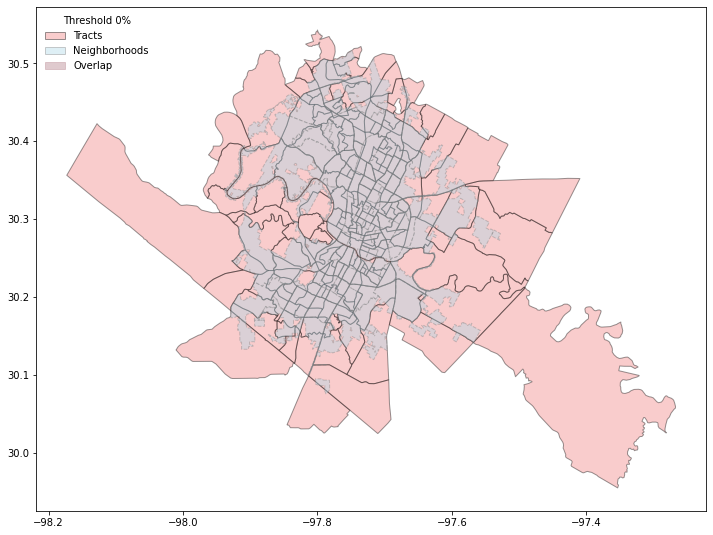

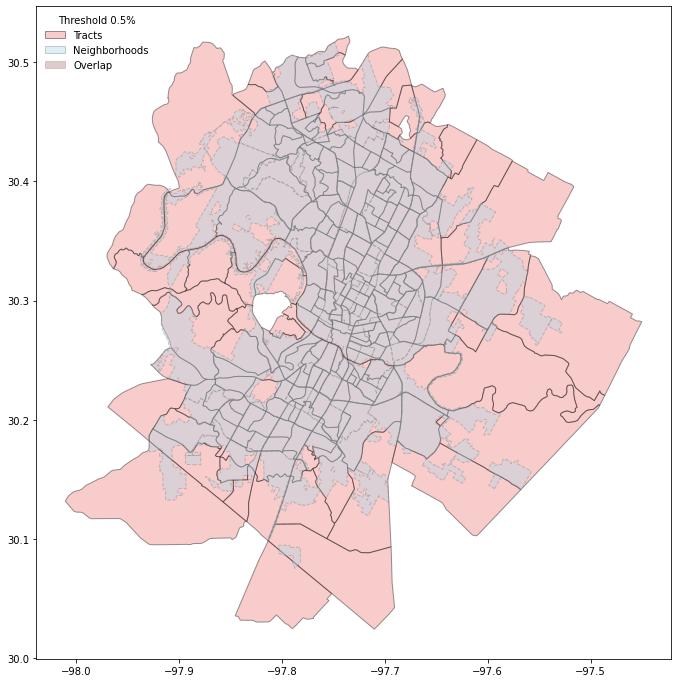

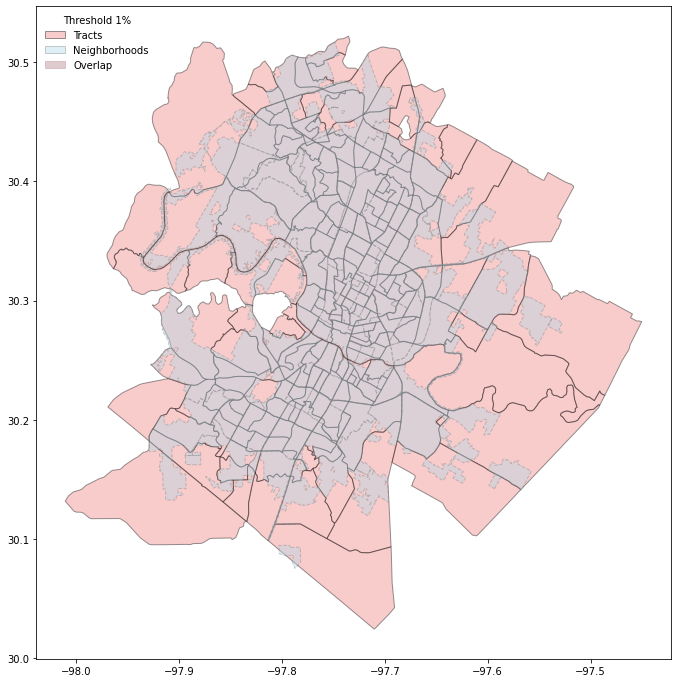

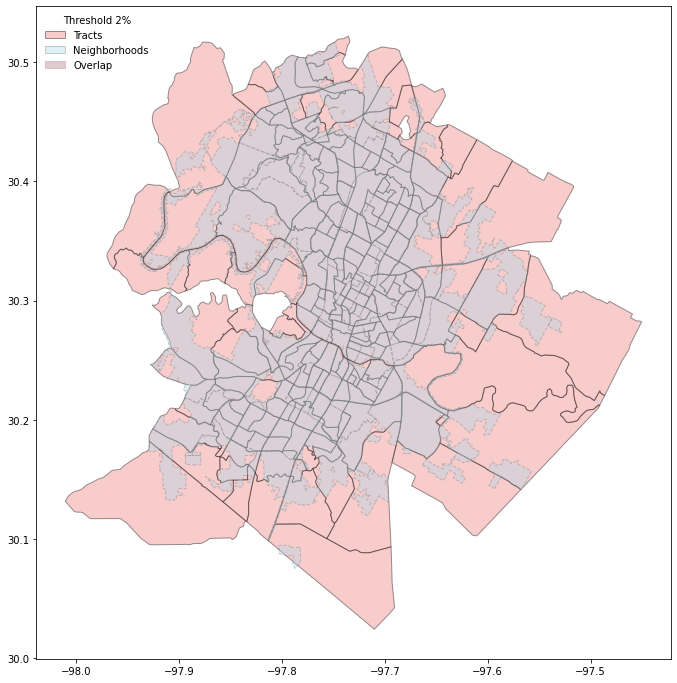

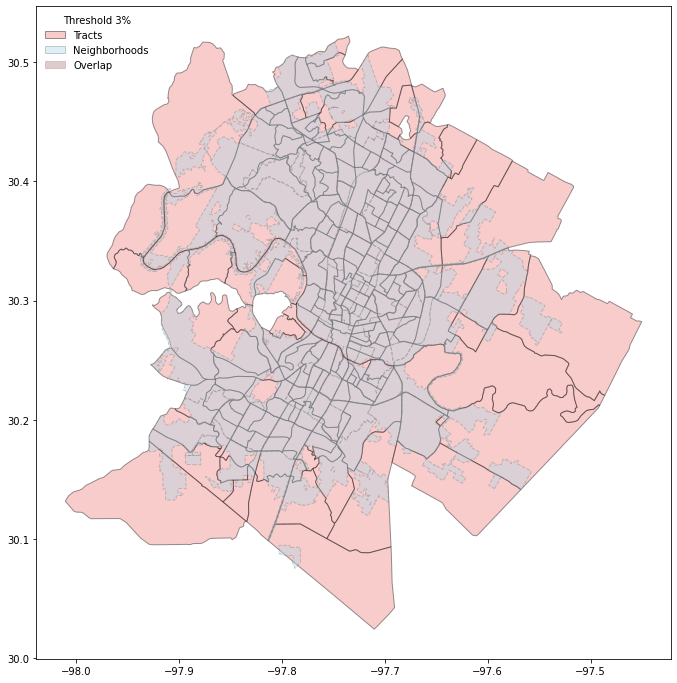

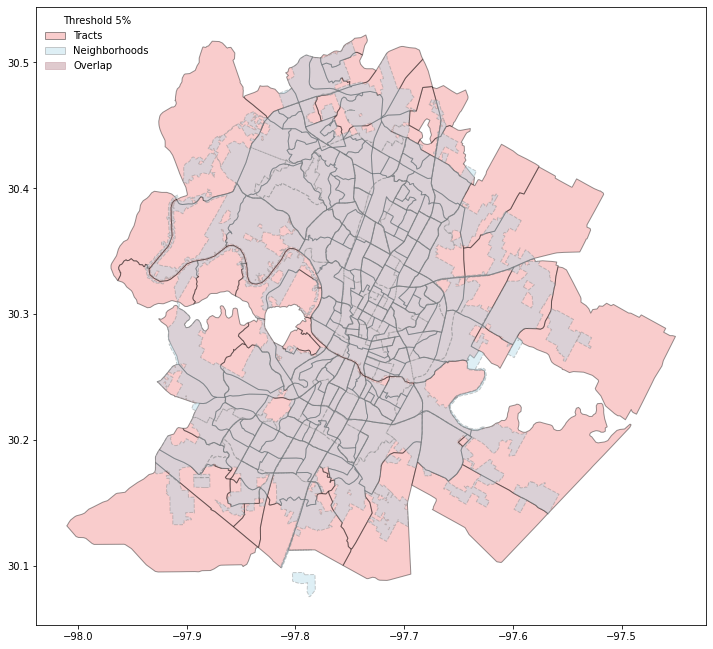

In [139]:
threshold_wrapper(city_list[0], city_results, threshold_list)

Baltimore
Threshold: 0
    Neighborhoods before & after: 278/278
               Neighborhood Loss: 0
    Unique Tracts before & after: 231/231
              Total Tracts after: 1199
                  Tract Multiple: 5.1905
               Neighborhood Area: 21.0355
          Overlapping Tract Area: 21.0285
          Overlapping Area Ratio: 0.9997
        All Filtered Tracts Area: 31.9239
             Filtered Area Ratio: 1.5176
     Total (double-counted) Area: 163.1955
            Dissolved Area Ratio: 7.7581
Threshold: 0.5
    Neighborhoods before & after: 278/278
               Neighborhood Loss: 0
    Unique Tracts before & after: 231/207
              Total Tracts after: 676
                  Tract Multiple: 3.2657
               Neighborhood Area: 21.0355
          Overlapping Tract Area: 20.9638
          Overlapping Area Ratio: 0.9966
        All Filtered Tracts Area: 23.3743
             Filtered Area Ratio: 1.1112
     Total (double-counted) Area: 90.4434
            Dissolved

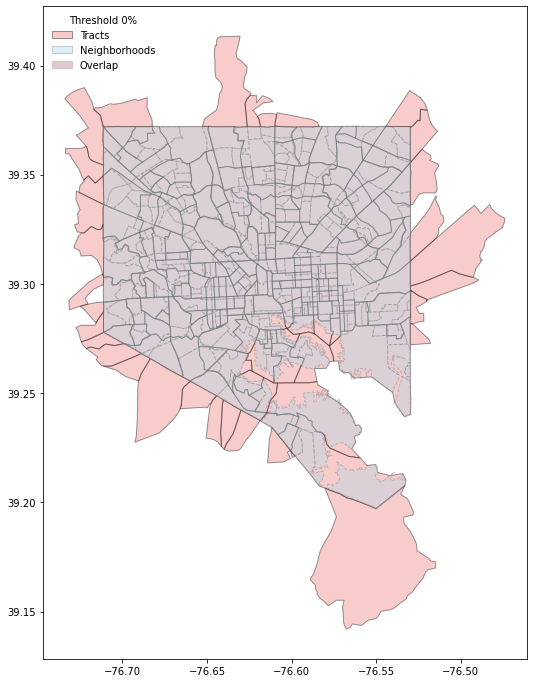

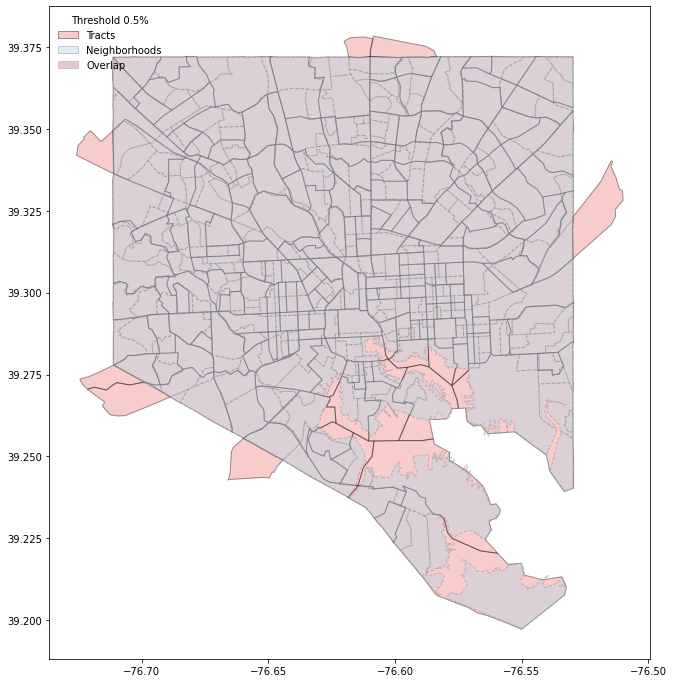

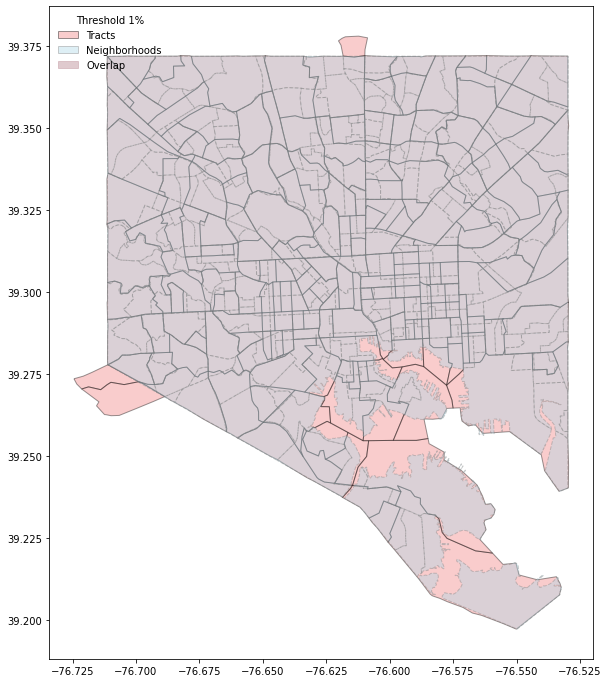

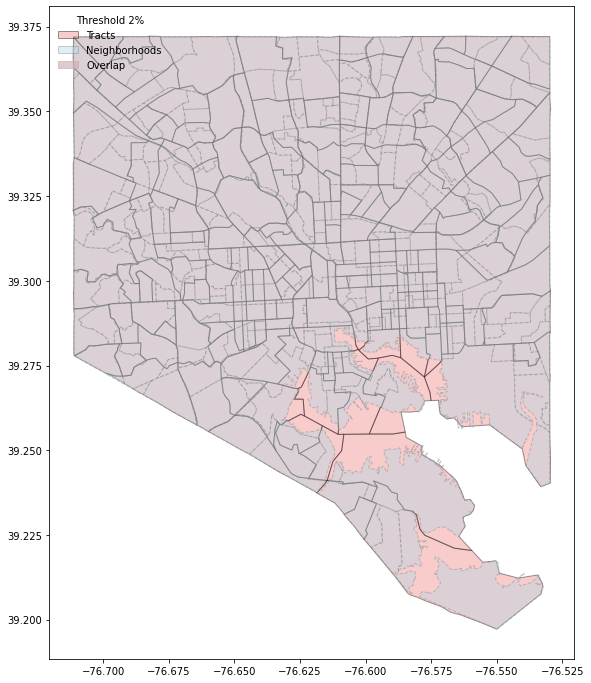

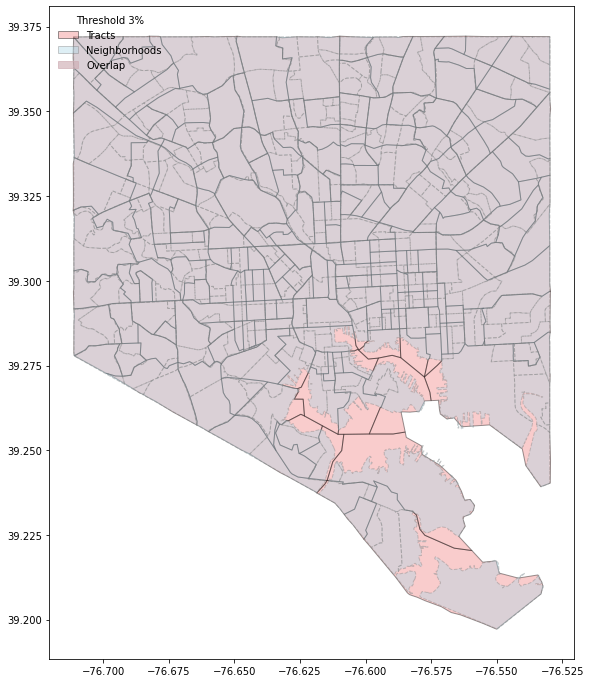

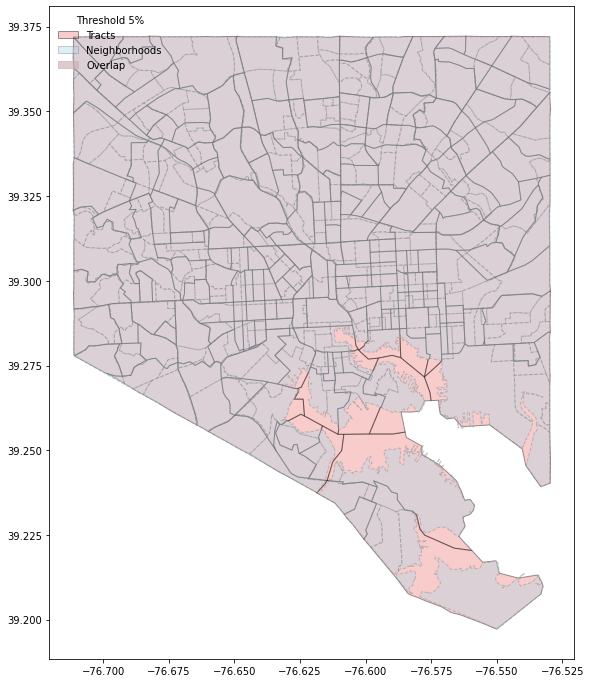

In [140]:
threshold_wrapper(city_list[1], city_results, threshold_list)

Boston
Threshold: 0
    Neighborhoods before & after: 26/26
               Neighborhood Loss: 0
    Unique Tracts before & after: 213/213
              Total Tracts after: 370
                  Tract Multiple: 1.7371
               Neighborhood Area: 12.6714
          Overlapping Tract Area: 12.654
          Overlapping Area Ratio: 0.9986
        All Filtered Tracts Area: 22.6177
             Filtered Area Ratio: 1.7849
     Total (double-counted) Area: 37.9315
            Dissolved Area Ratio: 2.9935
Threshold: 0.5
    Neighborhoods before & after: 26/26
               Neighborhood Loss: 0
    Unique Tracts before & after: 213/184
              Total Tracts after: 260
                  Tract Multiple: 1.413
               Neighborhood Area: 12.6714
          Overlapping Tract Area: 12.639
          Overlapping Area Ratio: 0.9974
        All Filtered Tracts Area: 14.5818
             Filtered Area Ratio: 1.1508
     Total (double-counted) Area: 21.9002
            Dissolved Area Ratio:

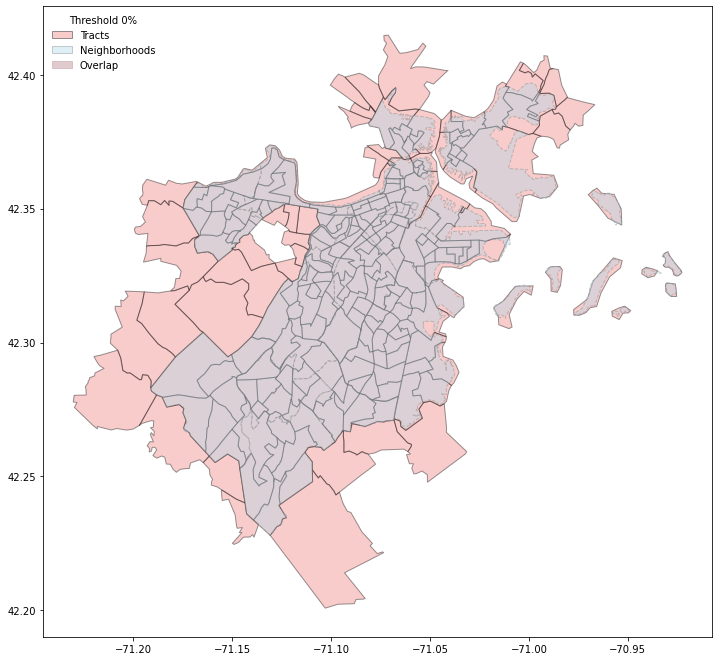

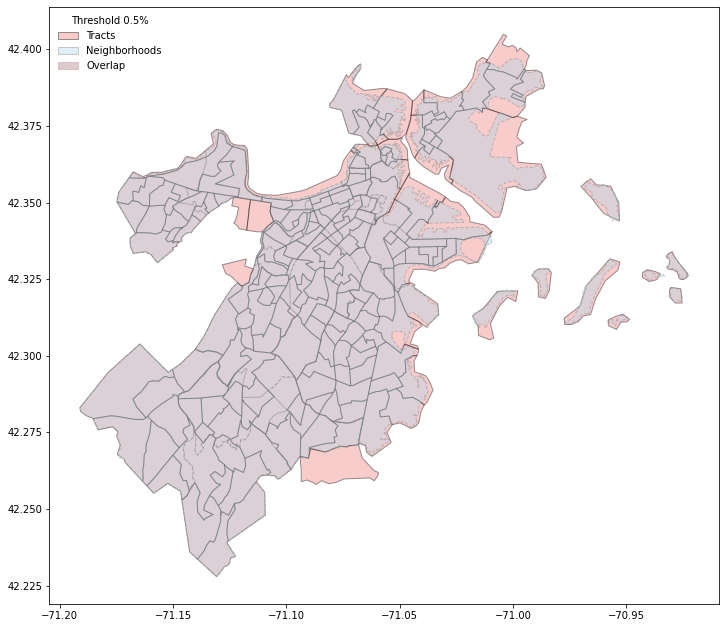

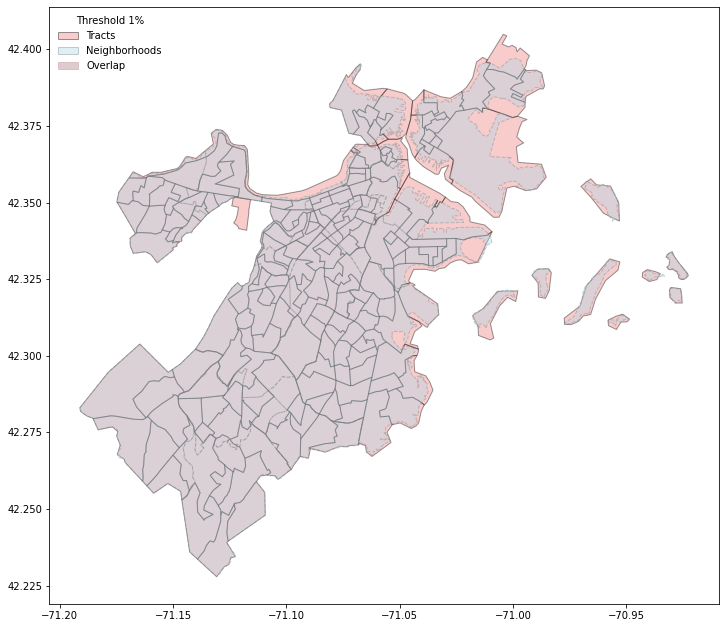

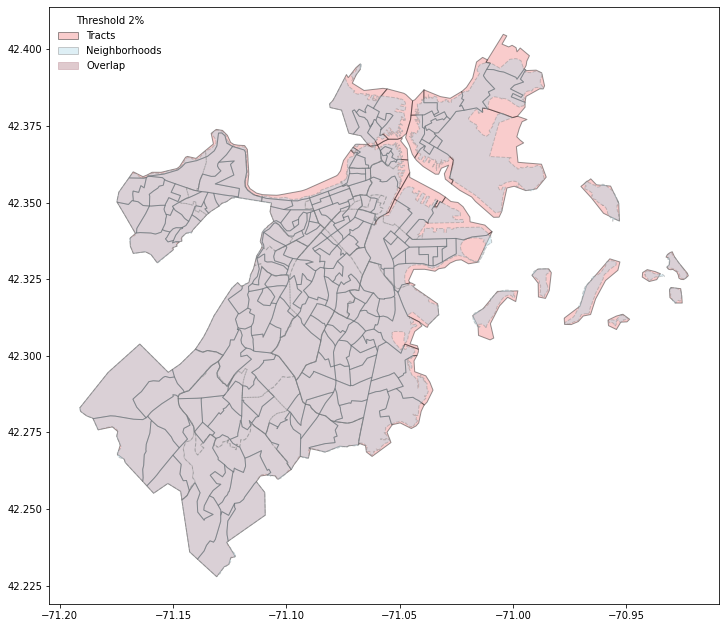

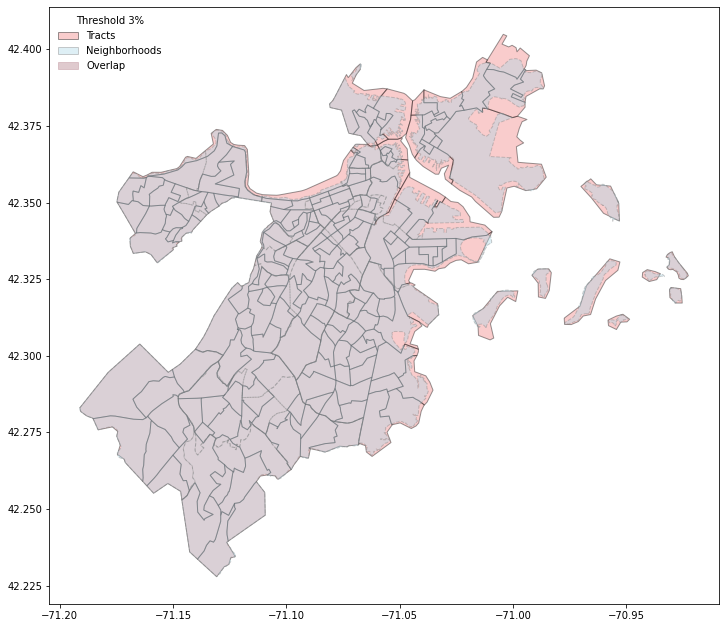

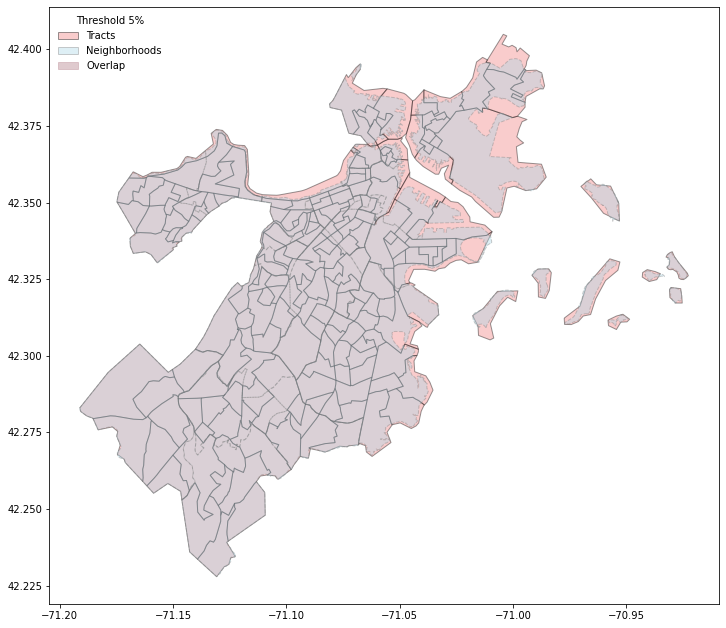

In [141]:
threshold_wrapper(city_list[2], city_results, threshold_list)

Dallas
Threshold: 0
    Neighborhoods before & after: 14/14
               Neighborhood Loss: 0
    Unique Tracts before & after: 383/383
              Total Tracts after: 600
                  Tract Multiple: 1.5666
               Neighborhood Area: 99.3632
          Overlapping Tract Area: 99.3632
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 192.0507
             Filtered Area Ratio: 1.9328
     Total (double-counted) Area: 268.0992
            Dissolved Area Ratio: 2.6982
Threshold: 0.5
    Neighborhoods before & after: 14/14
               Neighborhood Loss: 0
    Unique Tracts before & after: 383/362
              Total Tracts after: 464
                  Tract Multiple: 1.2818
               Neighborhood Area: 99.3632
          Overlapping Tract Area: 99.2999
          Overlapping Area Ratio: 0.9994
        All Filtered Tracts Area: 165.6354
             Filtered Area Ratio: 1.667
     Total (double-counted) Area: 202.8774
            Dissolved Area Rat

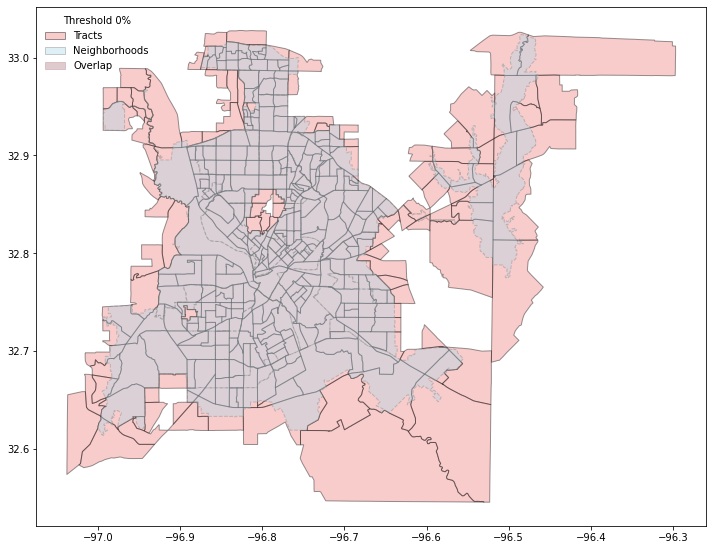

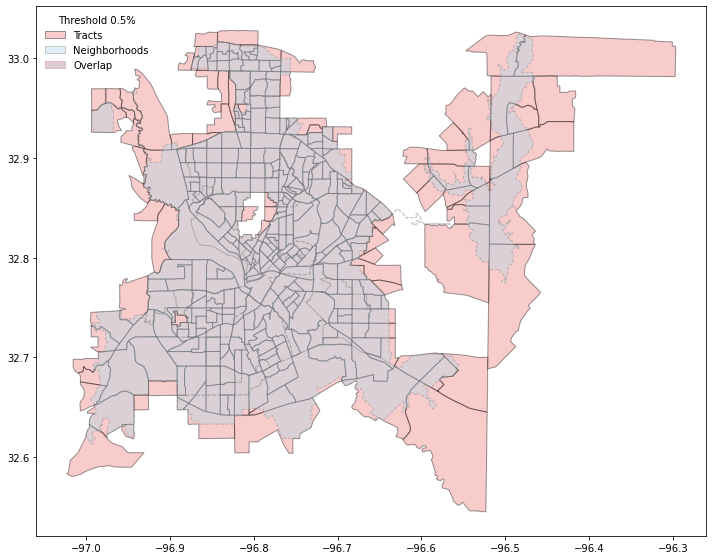

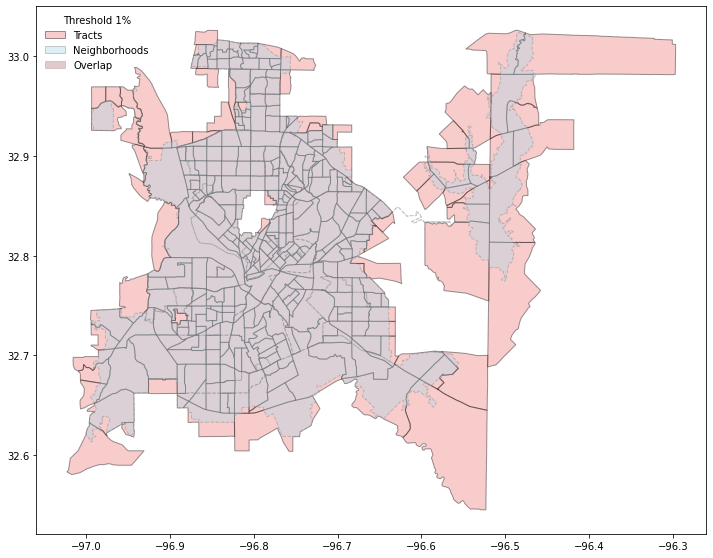

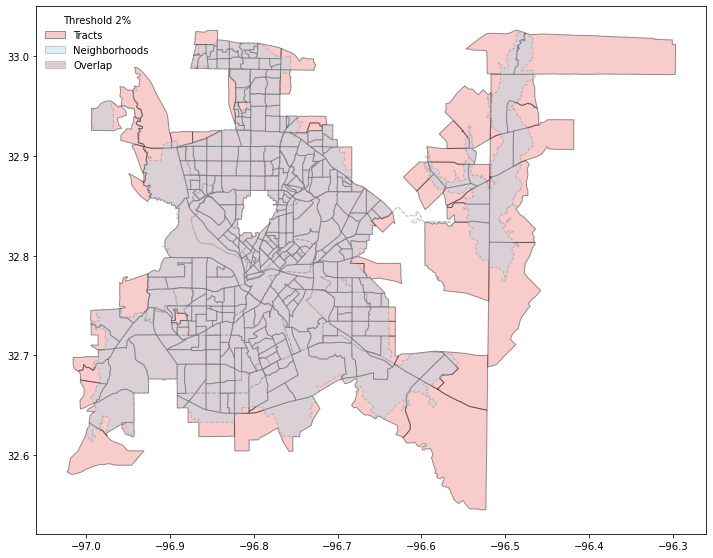

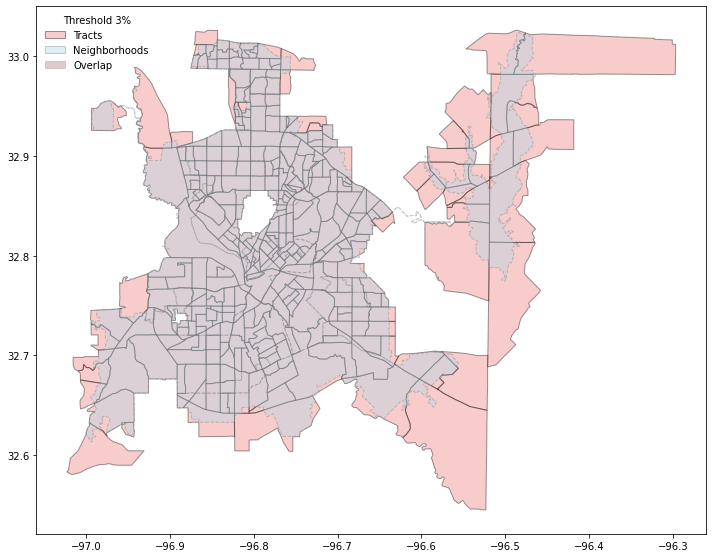

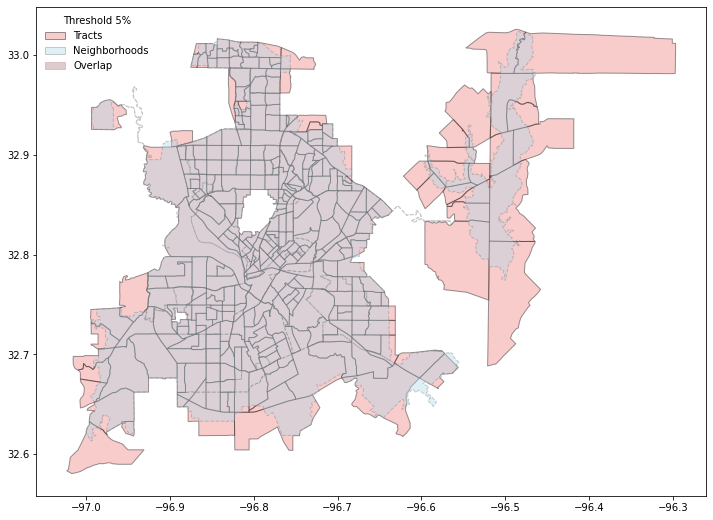

In [142]:
threshold_wrapper(city_list[3], city_results, threshold_list)

Denver
Threshold: 0
    Neighborhoods before & after: 78/78
               Neighborhood Loss: 0
    Unique Tracts before & after: 203/203
              Total Tracts after: 654
                  Tract Multiple: 3.2217
               Neighborhood Area: 40.0792
          Overlapping Tract Area: 40.0797
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 147.7941
             Filtered Area Ratio: 3.6876
     Total (double-counted) Area: 283.7005
            Dissolved Area Ratio: 7.0785
Threshold: 0.5
    Neighborhoods before & after: 78/78
               Neighborhood Loss: 0
    Unique Tracts before & after: 203/165
              Total Tracts after: 200
                  Tract Multiple: 1.2121
               Neighborhood Area: 40.0792
          Overlapping Tract Area: 39.8832
          Overlapping Area Ratio: 0.9951
        All Filtered Tracts Area: 46.7628
             Filtered Area Ratio: 1.1668
     Total (double-counted) Area: 53.0278
            Dissolved Area Rati

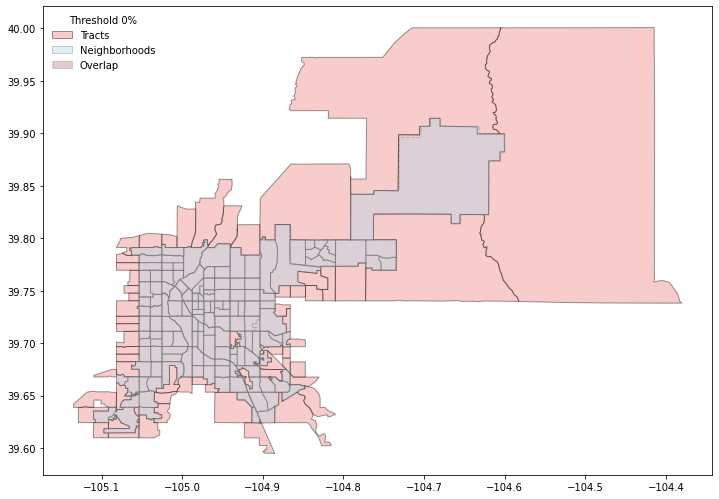

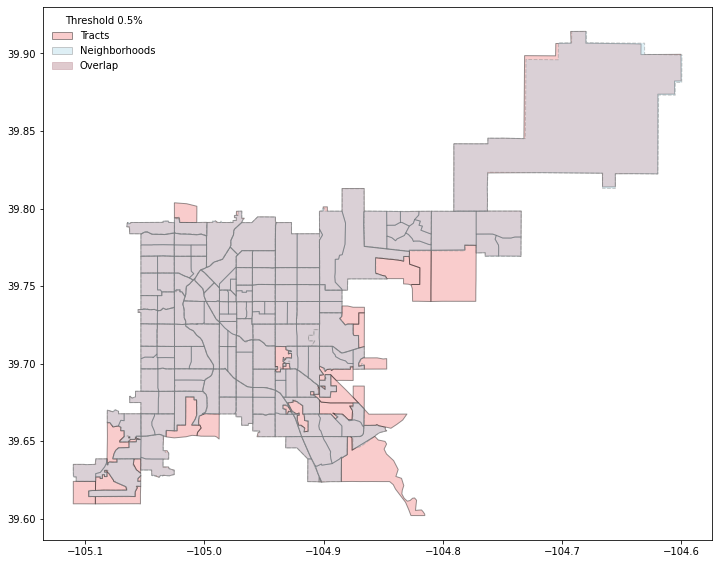

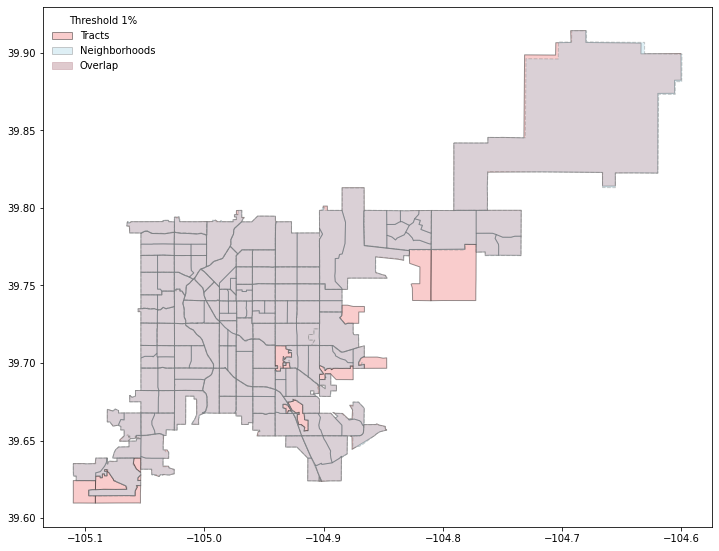

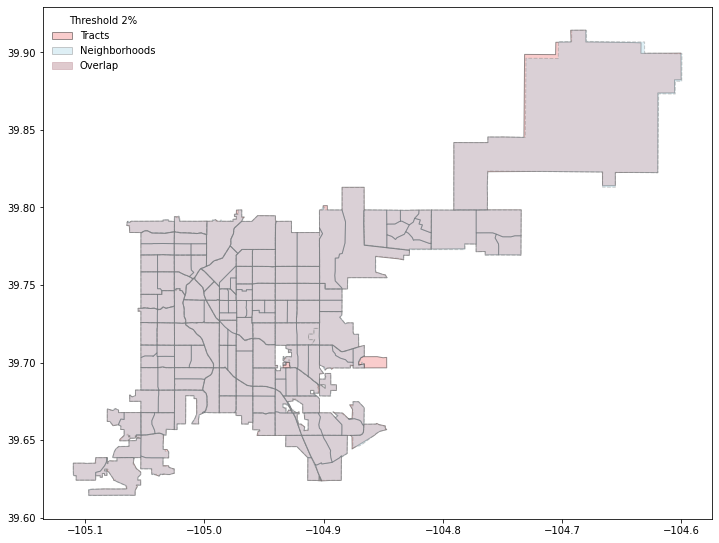

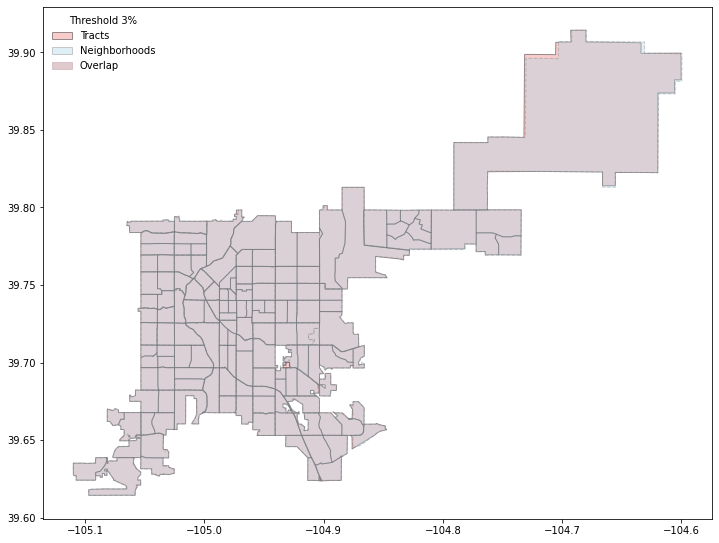

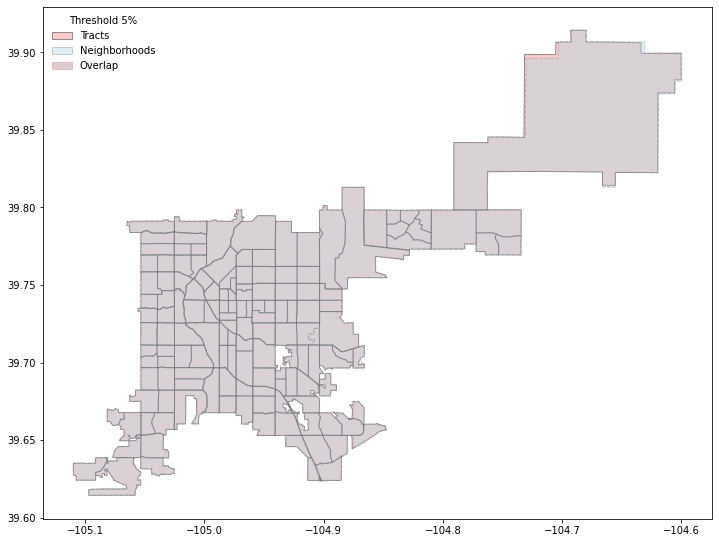

In [143]:
threshold_wrapper(city_list[4], city_results, threshold_list)

Detroit
Threshold: 0
    Neighborhoods before & after: 208/208
               Neighborhood Loss: 0
    Unique Tracts before & after: 350/350
              Total Tracts after: 1217
                  Tract Multiple: 3.4771
               Neighborhood Area: 35.9994
          Overlapping Tract Area: 35.9994
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 48.3622
             Filtered Area Ratio: 1.3434
     Total (double-counted) Area: 165.9334
            Dissolved Area Ratio: 4.6093
Threshold: 0.5
    Neighborhoods before & after: 208/208
               Neighborhood Loss: 0
    Unique Tracts before & after: 350/303
              Total Tracts after: 532
                  Tract Multiple: 1.7558
               Neighborhood Area: 35.9994
          Overlapping Tract Area: 35.9508
          Overlapping Area Ratio: 0.9986
        All Filtered Tracts Area: 38.1508
             Filtered Area Ratio: 1.0598
     Total (double-counted) Area: 70.1526
            Dissolved Area

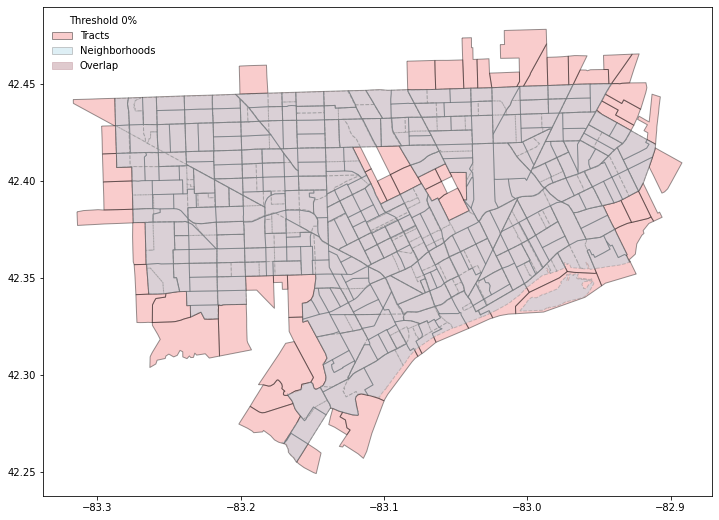

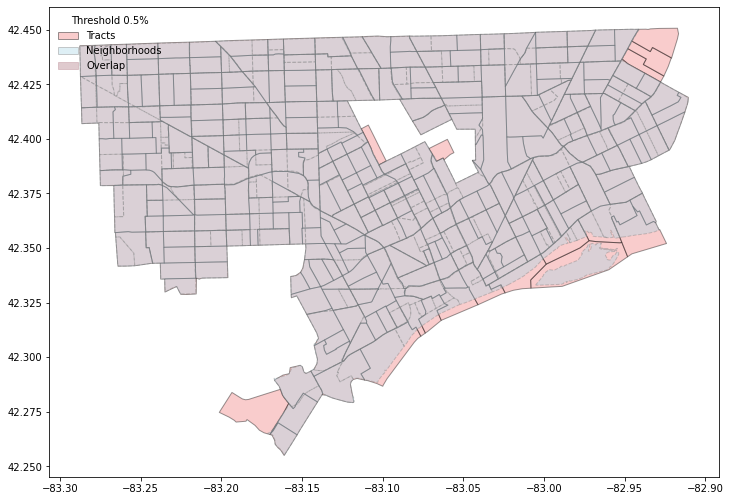

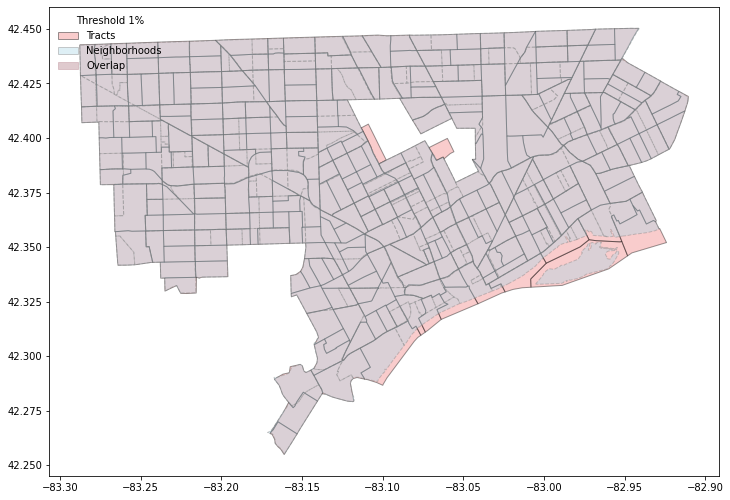

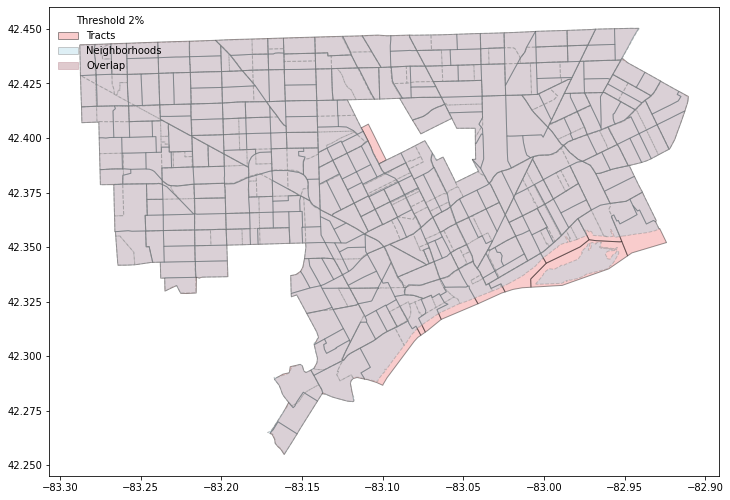

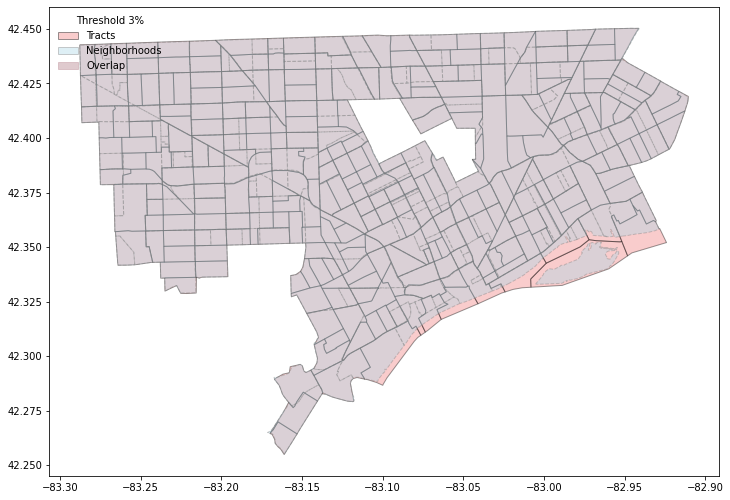

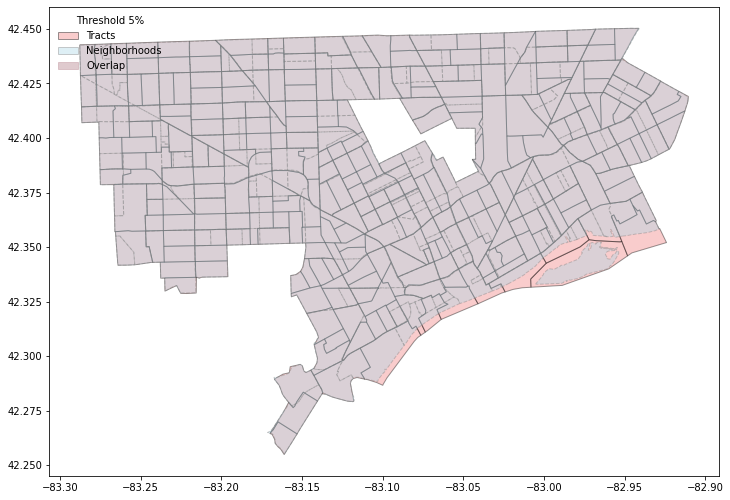

In [144]:
threshold_wrapper(city_list[5], city_results, threshold_list)

Houston
Threshold: 0
    Neighborhoods before & after: 88/88
               Neighborhood Loss: 0
    Unique Tracts before & after: 575/575
              Total Tracts after: 1155
                  Tract Multiple: 2.0087
               Neighborhood Area: 154.787
          Overlapping Tract Area: 154.787
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 269.4204
             Filtered Area Ratio: 1.7406
     Total (double-counted) Area: 524.2531
            Dissolved Area Ratio: 3.3869
Threshold: 0.5
    Neighborhoods before & after: 88/88
               Neighborhood Loss: 0
    Unique Tracts before & after: 575/552
              Total Tracts after: 825
                  Tract Multiple: 1.4946
               Neighborhood Area: 154.787
          Overlapping Tract Area: 154.6138
          Overlapping Area Ratio: 0.9989
        All Filtered Tracts Area: 252.1812
             Filtered Area Ratio: 1.6292
     Total (double-counted) Area: 365.7361
            Dissolved Area

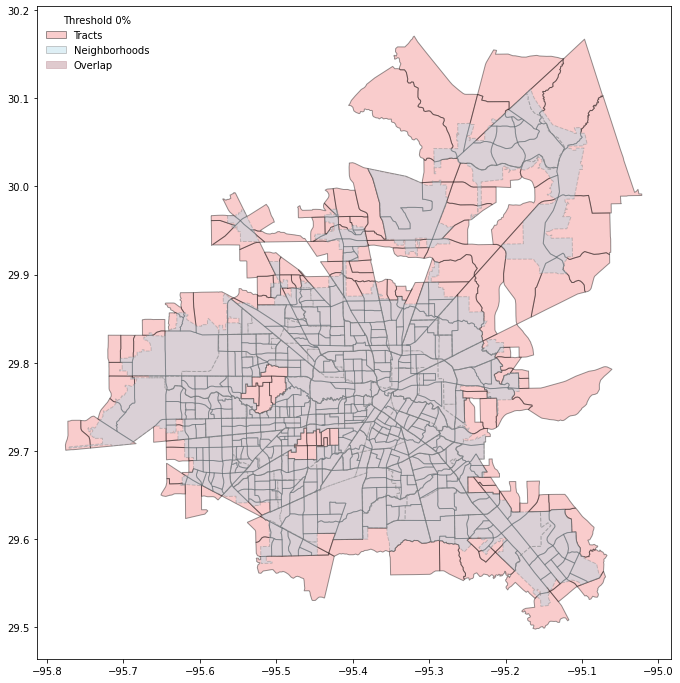

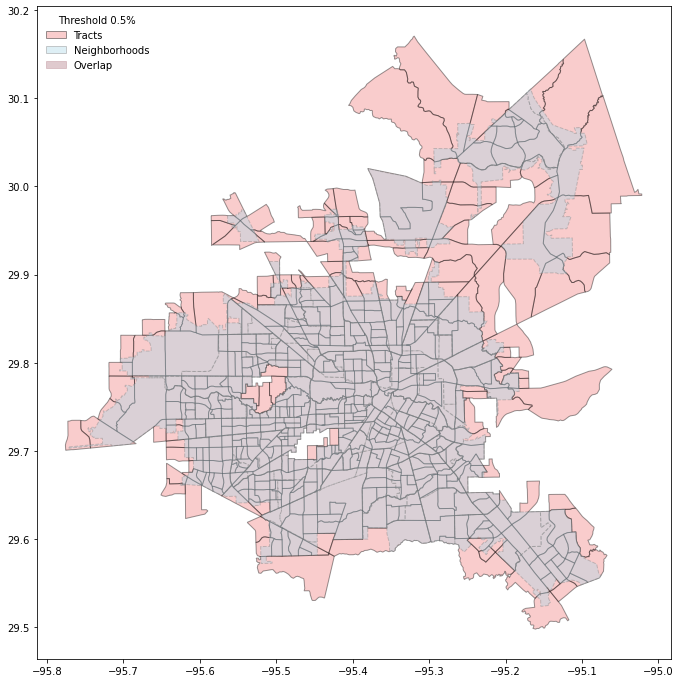

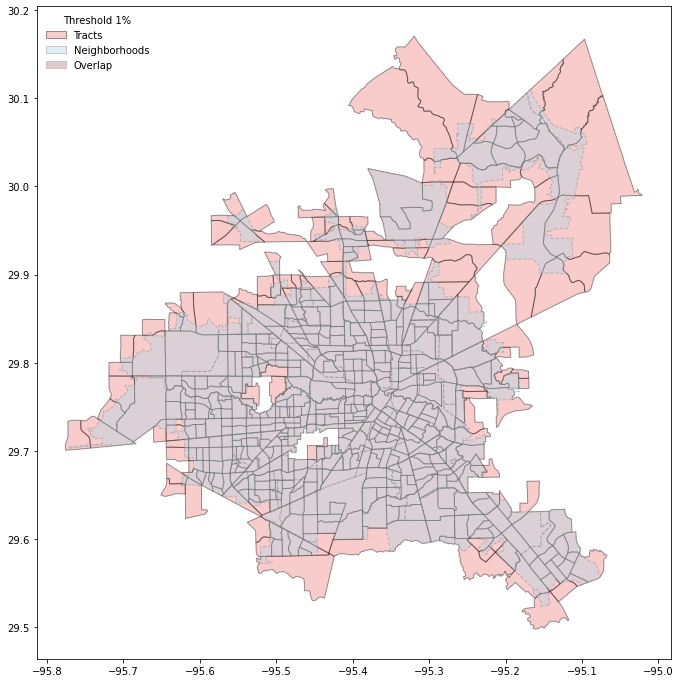

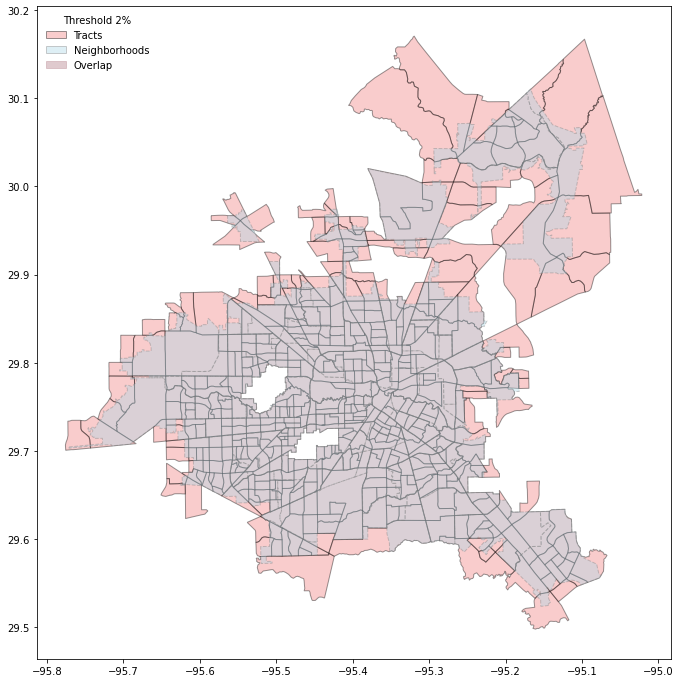

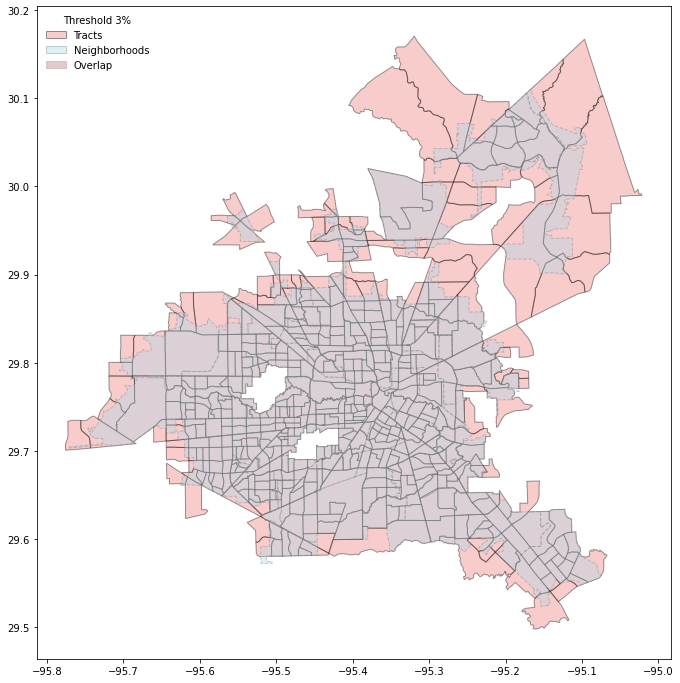

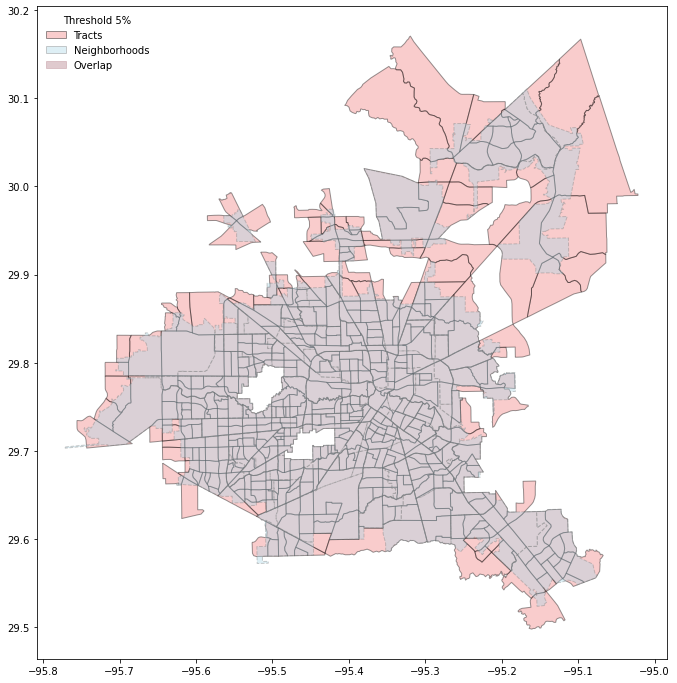

In [145]:
threshold_wrapper(city_list[6], city_results, threshold_list)

Indianapolis
Threshold: 0
    Neighborhoods before & after: 99/99
               Neighborhood Loss: 0
    Unique Tracts before & after: 247/247
              Total Tracts after: 742
                  Tract Multiple: 3.004
               Neighborhood Area: 104.3737
          Overlapping Tract Area: 104.3735
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 190.621
             Filtered Area Ratio: 1.8263
     Total (double-counted) Area: 564.885
            Dissolved Area Ratio: 5.4121
Threshold: 0.5
    Neighborhoods before & after: 99/99
               Neighborhood Loss: 0
    Unique Tracts before & after: 247/224
              Total Tracts after: 454
                  Tract Multiple: 2.0268
               Neighborhood Area: 104.3737
          Overlapping Tract Area: 104.2391
          Overlapping Area Ratio: 0.9987
        All Filtered Tracts Area: 104.3812
             Filtered Area Ratio: 1.0001
     Total (double-counted) Area: 275.4131
            Dissolved 

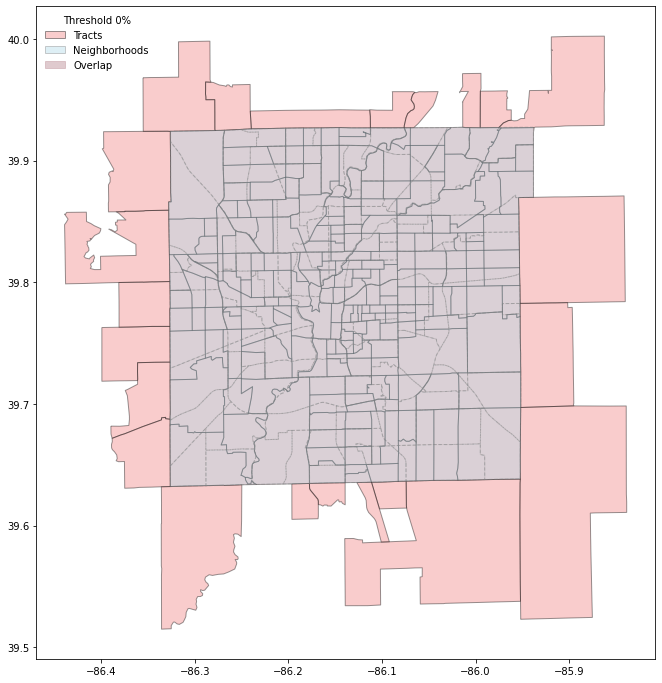

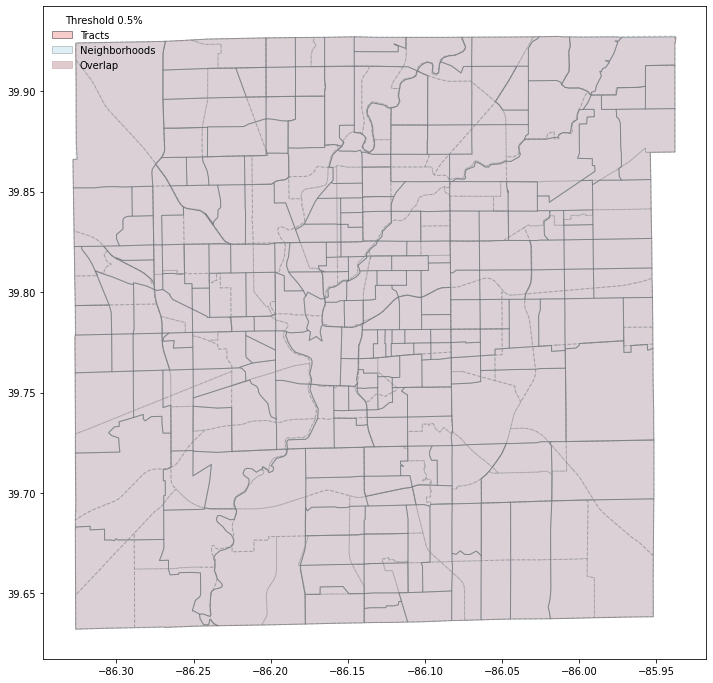

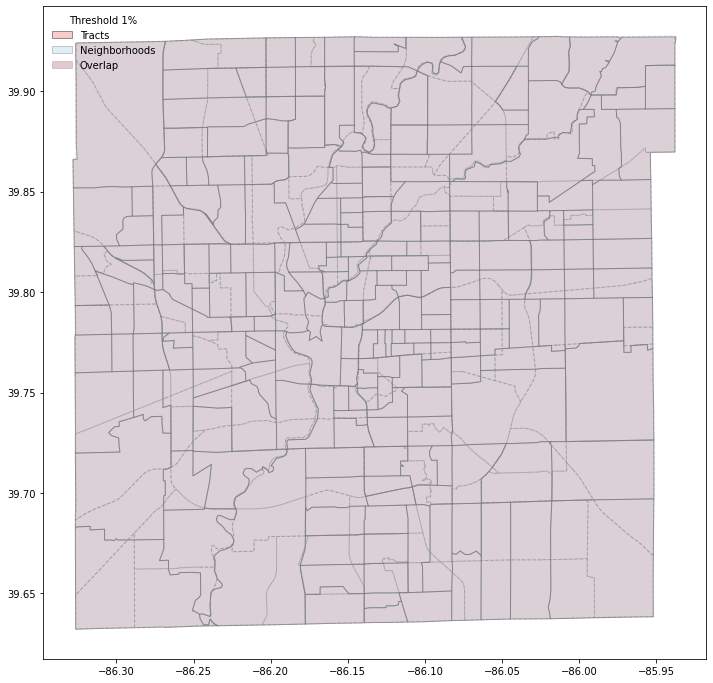

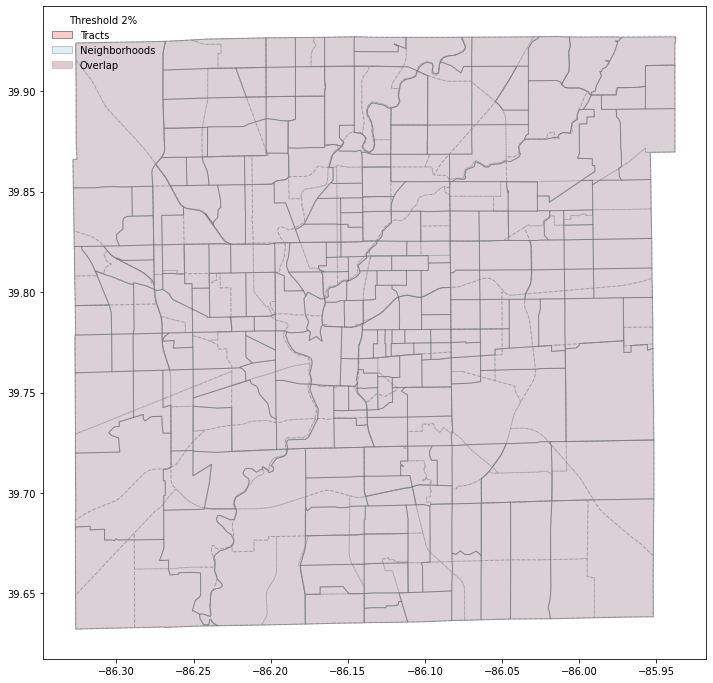

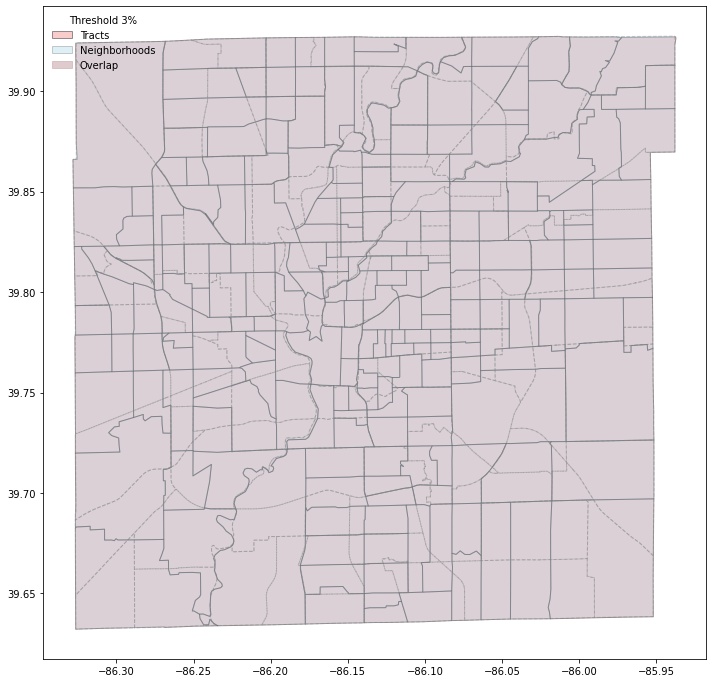

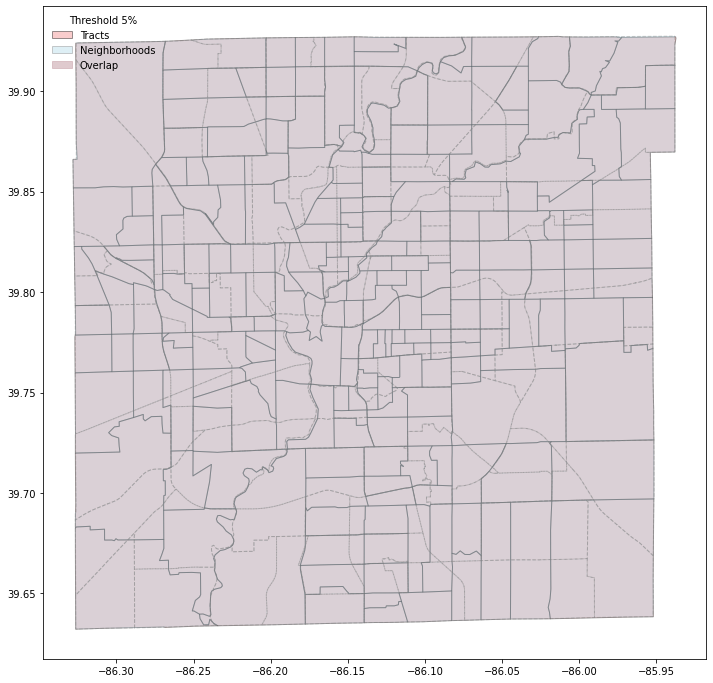

In [146]:
threshold_wrapper(city_list[7], city_results, threshold_list)

Los Angeles
Threshold: 0
    Neighborhoods before & after: 272/272
               Neighborhood Loss: 0
    Unique Tracts before & after: 2396/2396
              Total Tracts after: 5017
                  Tract Multiple: 2.0939
               Neighborhood Area: 1043.459
          Overlapping Tract Area: 1043.0846
          Overlapping Area Ratio: 0.9996
        All Filtered Tracts Area: 2111.1769
             Filtered Area Ratio: 2.0232
     Total (double-counted) Area: 5680.8453
            Dissolved Area Ratio: 5.4442
Threshold: 0.5
    Neighborhoods before & after: 272/272
               Neighborhood Loss: 0
    Unique Tracts before & after: 2396/2354
              Total Tracts after: 3603
                  Tract Multiple: 1.5306
               Neighborhood Area: 1043.459
          Overlapping Tract Area: 1041.6458
          Overlapping Area Ratio: 0.9983
        All Filtered Tracts Area: 1068.3696
             Filtered Area Ratio: 1.0239
     Total (double-counted) Area: 2408.1035
 

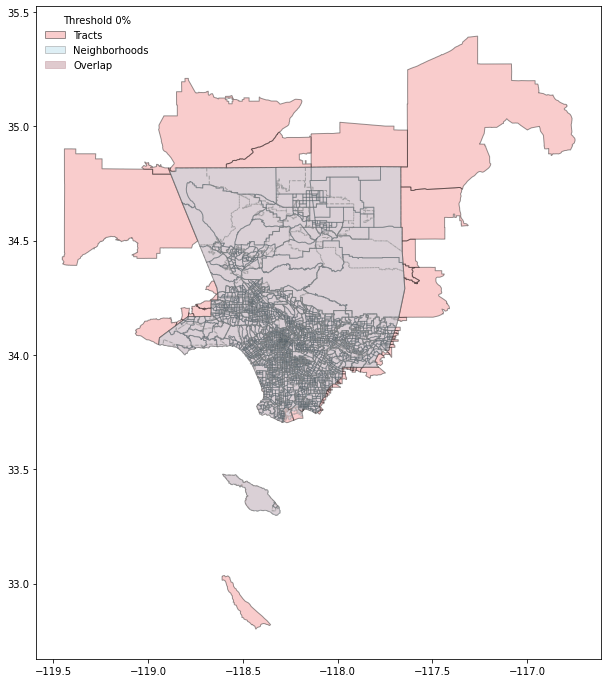

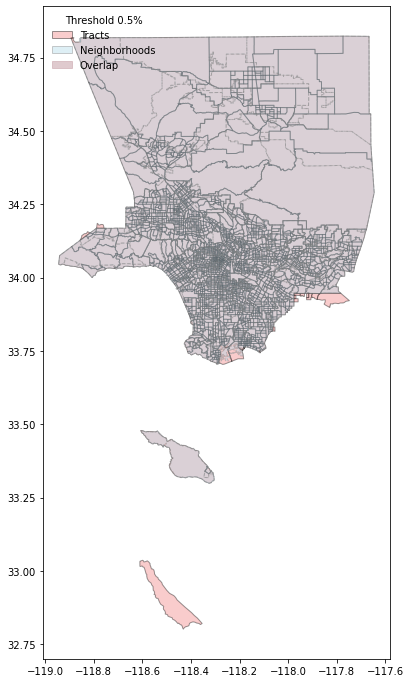

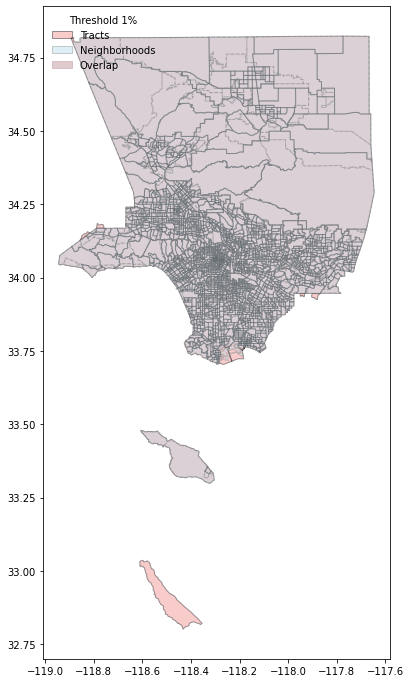

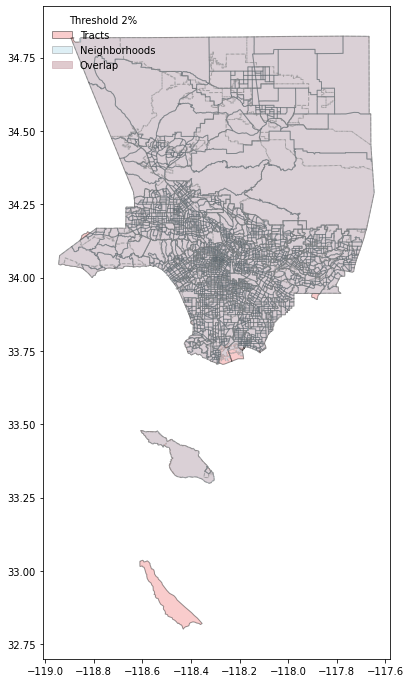

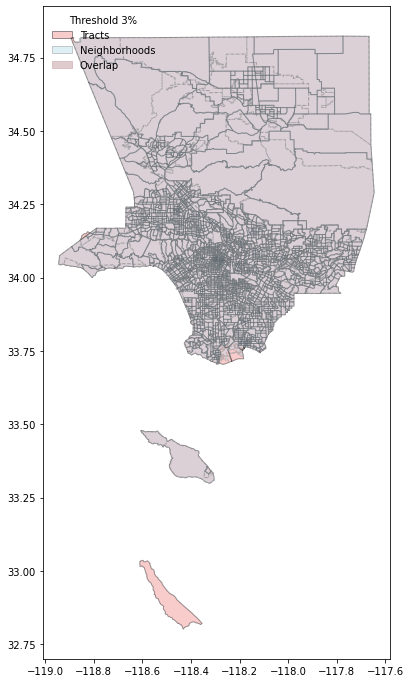

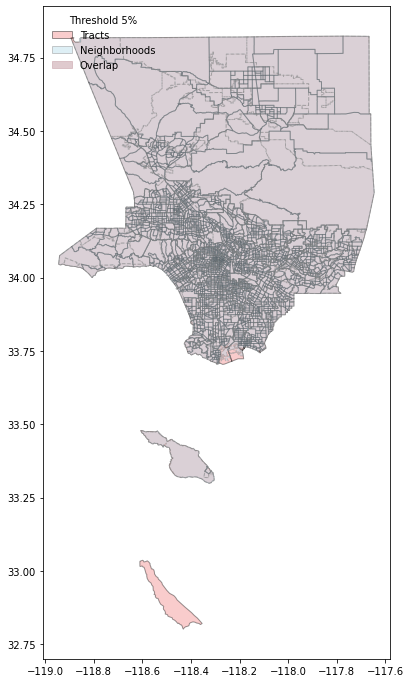

In [147]:
threshold_wrapper(city_list[8], city_results, threshold_list)

Louisville
Threshold: 0
    Neighborhoods before & after: 92/92
               Neighborhood Loss: 0
    Unique Tracts before & after: 100/100
              Total Tracts after: 435
                  Tract Multiple: 4.35
               Neighborhood Area: 16.1011
          Overlapping Tract Area: 16.1011
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 27.7876
             Filtered Area Ratio: 1.7258
     Total (double-counted) Area: 132.2188
            Dissolved Area Ratio: 8.2118
Threshold: 0.5
    Neighborhoods before & after: 92/92
               Neighborhood Loss: 0
    Unique Tracts before & after: 100/96
              Total Tracts after: 235
                  Tract Multiple: 2.4479
               Neighborhood Area: 16.1011
          Overlapping Tract Area: 16.0509
          Overlapping Area Ratio: 0.9969
        All Filtered Tracts Area: 27.0265
             Filtered Area Ratio: 1.6785
     Total (double-counted) Area: 68.4775
            Dissolved Area Rati

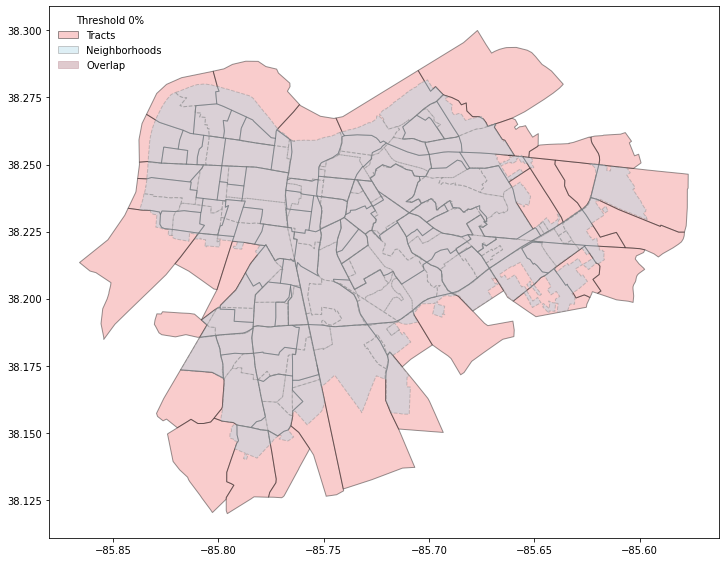

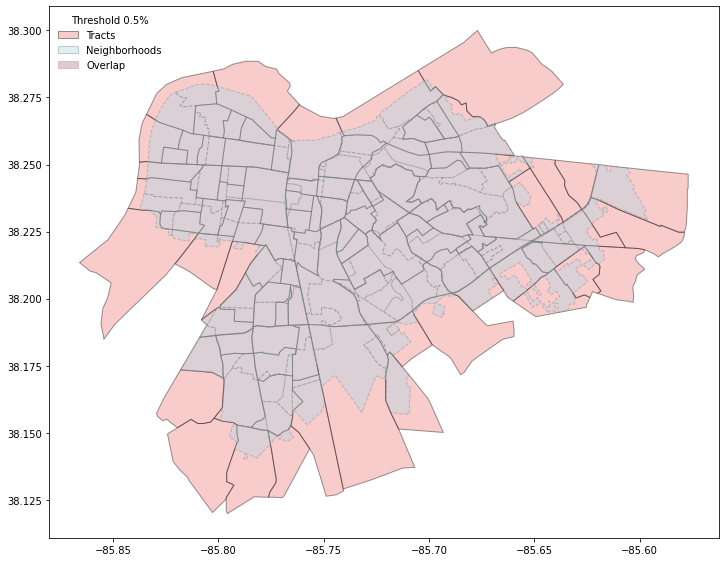

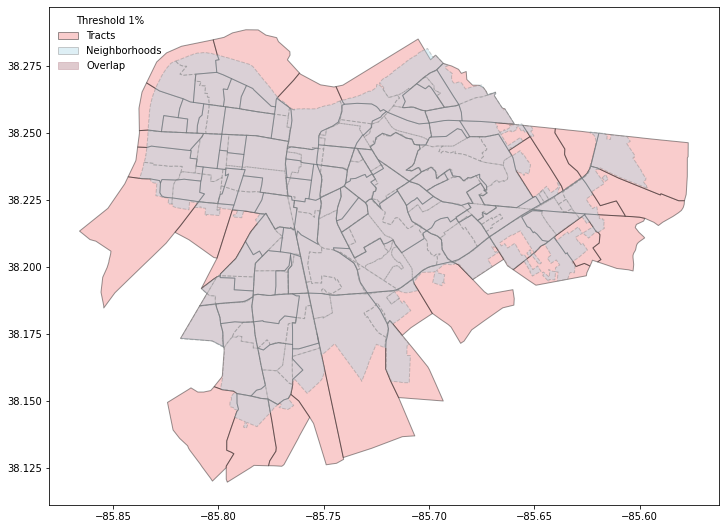

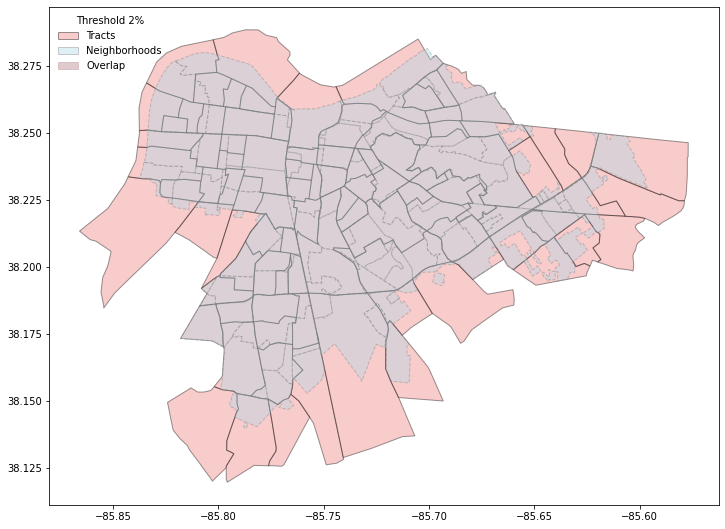

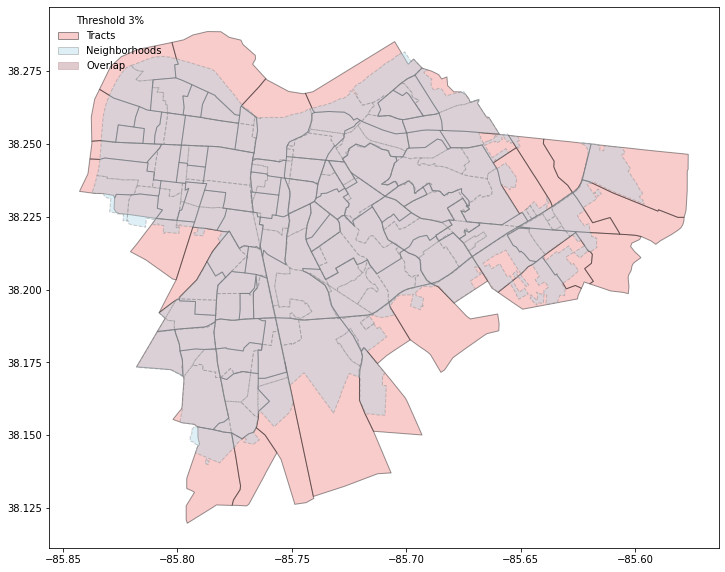

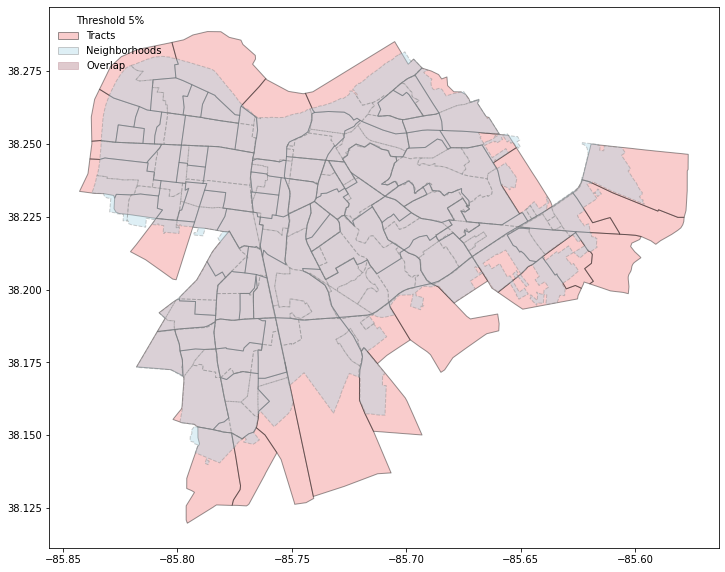

In [148]:
threshold_wrapper(city_list[9], city_results, threshold_list)

Phoenix
Threshold: 0
    Neighborhoods before & after: 15/15
               Neighborhood Loss: 0
    Unique Tracts before & after: 406/406
              Total Tracts after: 551
                  Tract Multiple: 1.3571
               Neighborhood Area: 144.0038
          Overlapping Tract Area: 144.0038
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 238.1006
             Filtered Area Ratio: 1.6534
     Total (double-counted) Area: 444.3628
            Dissolved Area Ratio: 3.0858
Threshold: 0.5
    Neighborhoods before & after: 15/15
               Neighborhood Loss: 0
    Unique Tracts before & after: 406/365
              Total Tracts after: 429
                  Tract Multiple: 1.1753
               Neighborhood Area: 144.0038
          Overlapping Tract Area: 143.9097
          Overlapping Area Ratio: 0.9993
        All Filtered Tracts Area: 177.2445
             Filtered Area Ratio: 1.2308
     Total (double-counted) Area: 264.2512
            Dissolved Ar

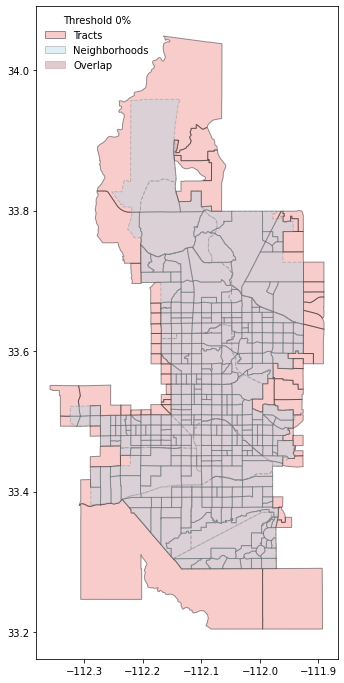

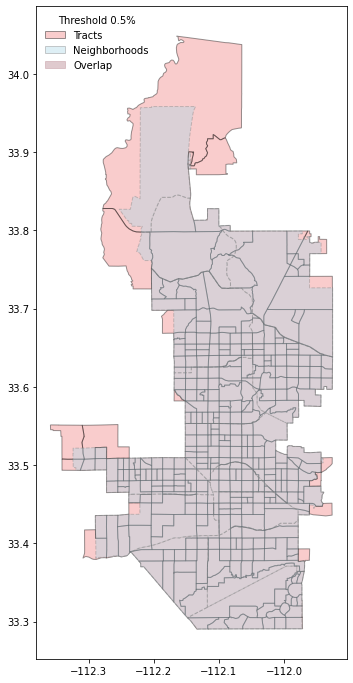

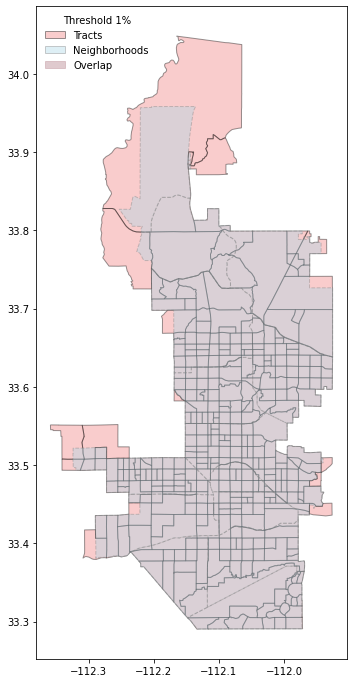

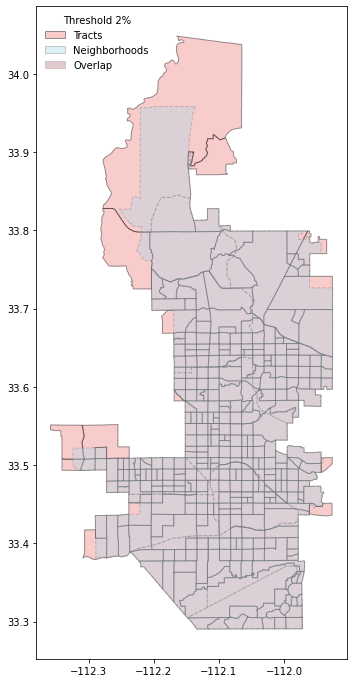

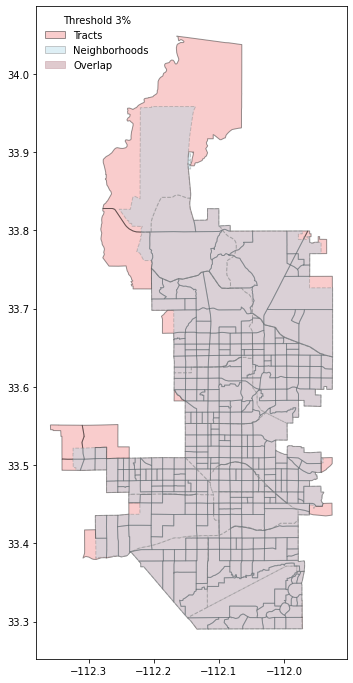

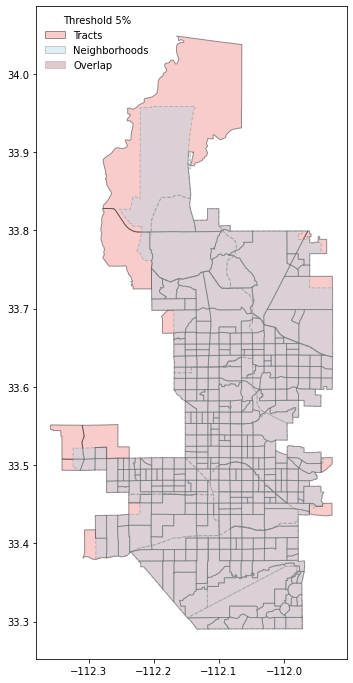

In [149]:
threshold_wrapper(city_list[10], city_results, threshold_list)

In [112]:
threshold_wrapper(city_list[11], city_results, threshold_list) # Portland did not work when overlaps were removed

Portland


TopologyException: side location conflict at -122.70543050961717 45.591217722566505


ValueError: No Shapely geometry can be created from null value

San Diego
Threshold: 0
    Neighborhoods before & after: 57/57
               Neighborhood Loss: 0
    Unique Tracts before & after: 332/332
              Total Tracts after: 701
                  Tract Multiple: 2.1114
               Neighborhood Area: 86.1012
          Overlapping Tract Area: 86.0852
          Overlapping Area Ratio: 0.9998
        All Filtered Tracts Area: 160.8758
             Filtered Area Ratio: 1.8685
     Total (double-counted) Area: 417.2689
            Dissolved Area Ratio: 4.8463
Threshold: 0.5
    Neighborhoods before & after: 57/57
               Neighborhood Loss: 0
    Unique Tracts before & after: 332/305
              Total Tracts after: 487
                  Tract Multiple: 1.5967
               Neighborhood Area: 86.1012
          Overlapping Tract Area: 85.8728
          Overlapping Area Ratio: 0.9973
        All Filtered Tracts Area: 129.2672
             Filtered Area Ratio: 1.5013
     Total (double-counted) Area: 238.8159
            Dissolved A

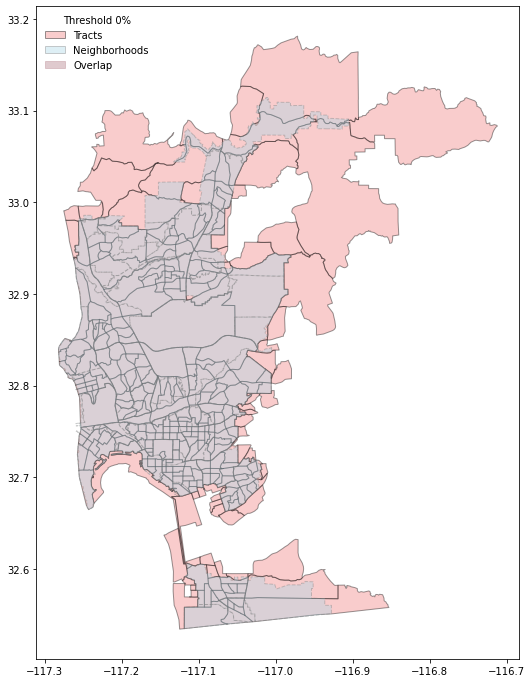

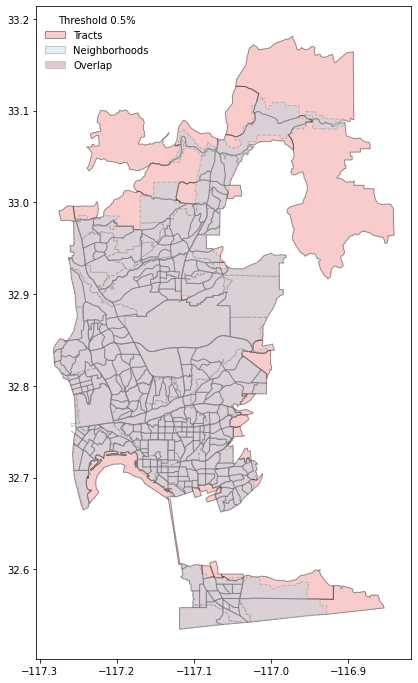

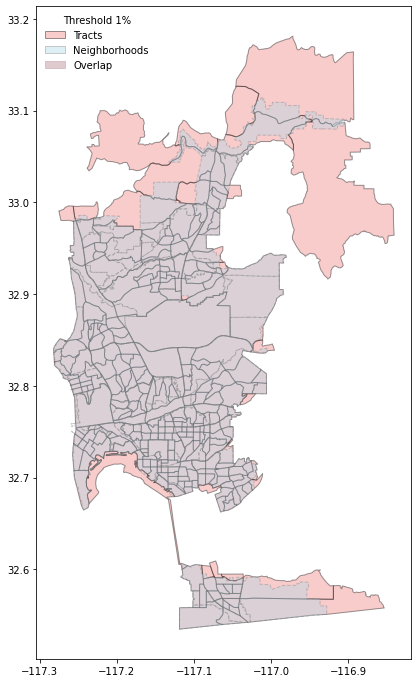

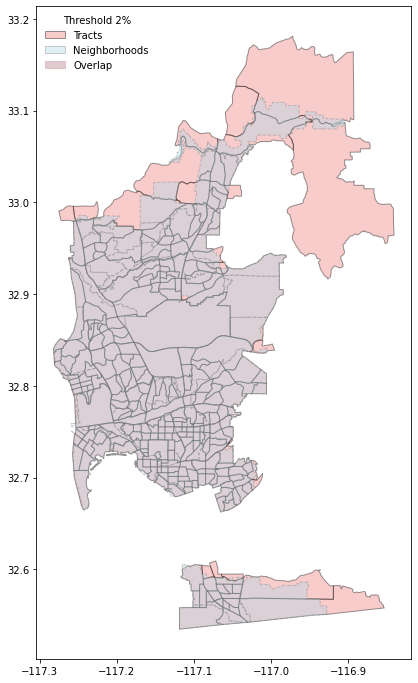

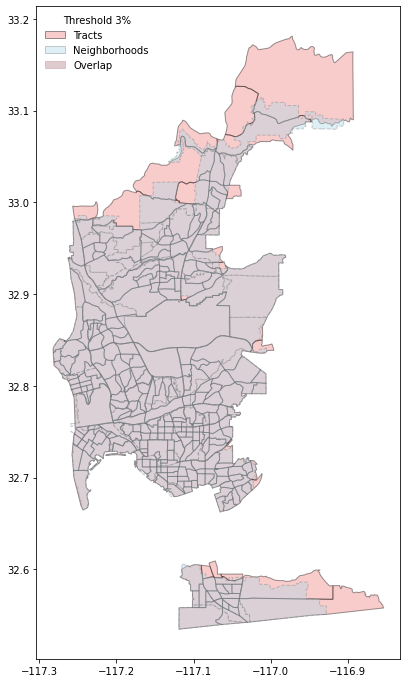

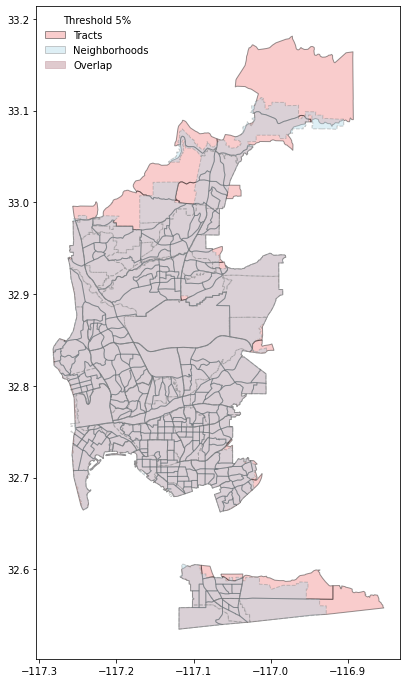

In [150]:
threshold_wrapper(city_list[12], city_results, threshold_list)

San Francisco
Threshold: 0
    Neighborhoods before & after: 117/117
               Neighborhood Loss: 0
    Unique Tracts before & after: 200/200
              Total Tracts after: 701
                  Tract Multiple: 3.505
               Neighborhood Area: 12.2641
          Overlapping Tract Area: 12.2107
          Overlapping Area Ratio: 0.9956
        All Filtered Tracts Area: 13.3067
             Filtered Area Ratio: 1.085
     Total (double-counted) Area: 57.7192
            Dissolved Area Ratio: 4.7064
Threshold: 0.5
    Neighborhoods before & after: 117/117
               Neighborhood Loss: 0
    Unique Tracts before & after: 200/196
              Total Tracts after: 469
                  Tract Multiple: 2.3929
               Neighborhood Area: 12.2641
          Overlapping Tract Area: 12.191
          Overlapping Area Ratio: 0.994
        All Filtered Tracts Area: 12.8436
             Filtered Area Ratio: 1.0473
     Total (double-counted) Area: 35.1297
            Dissolved A

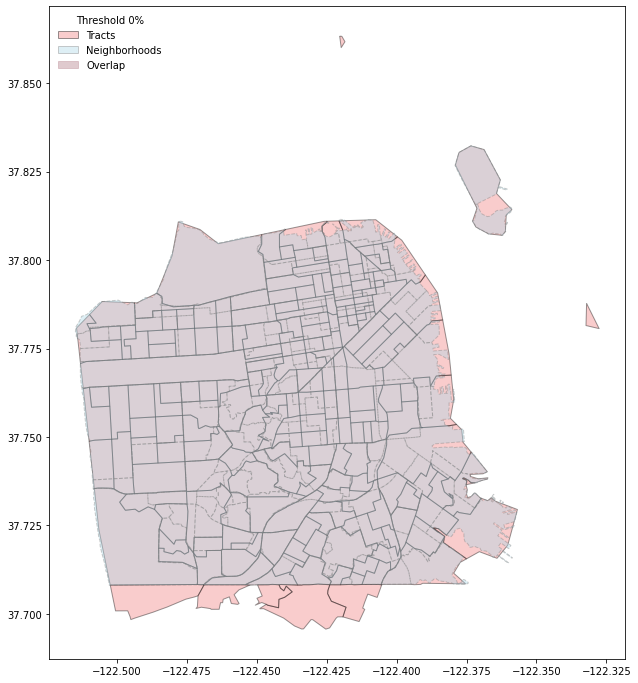

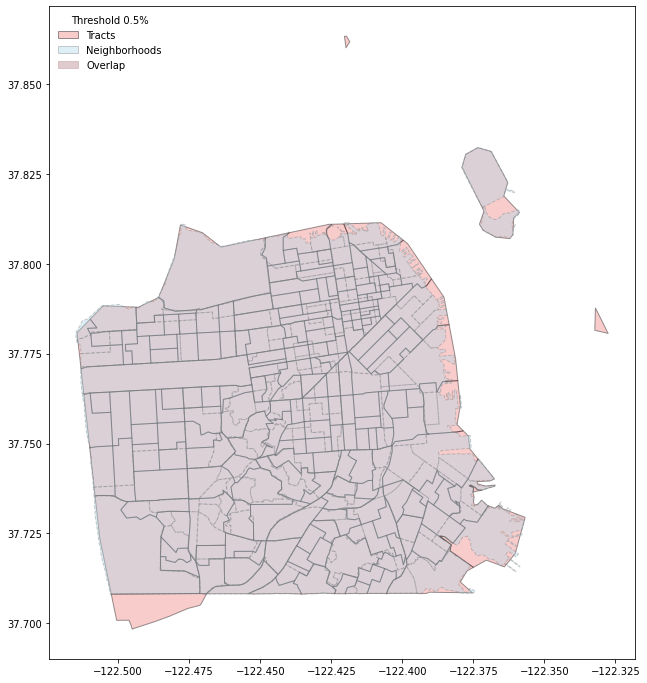

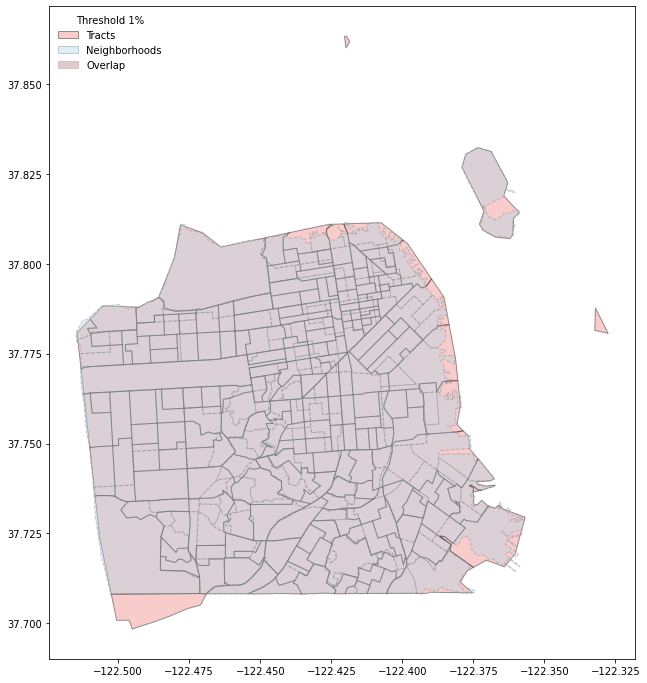

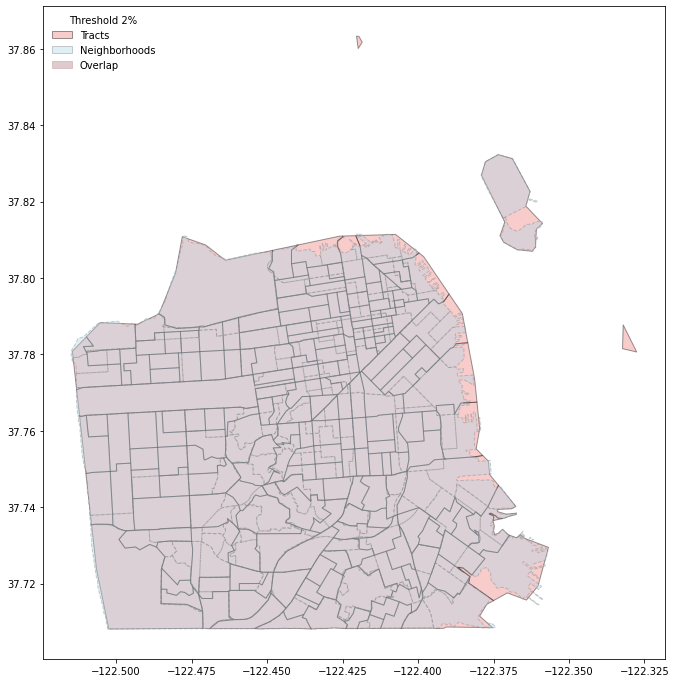

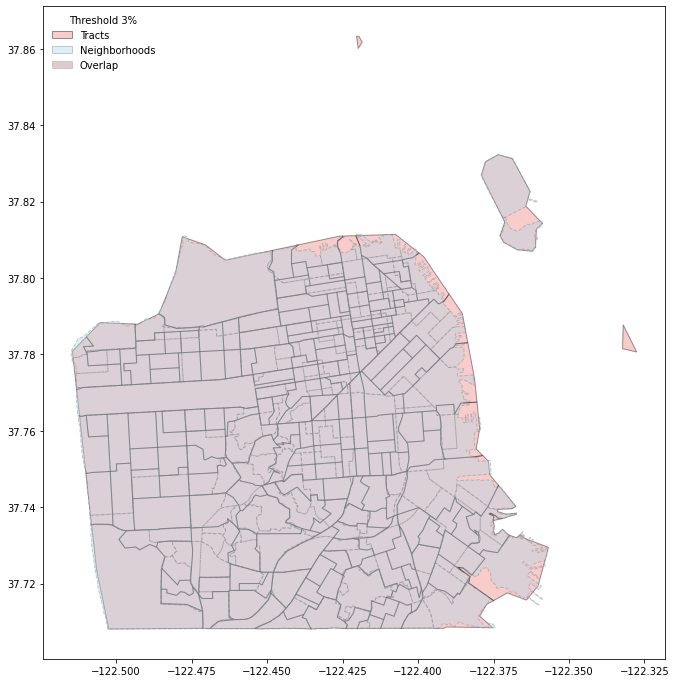

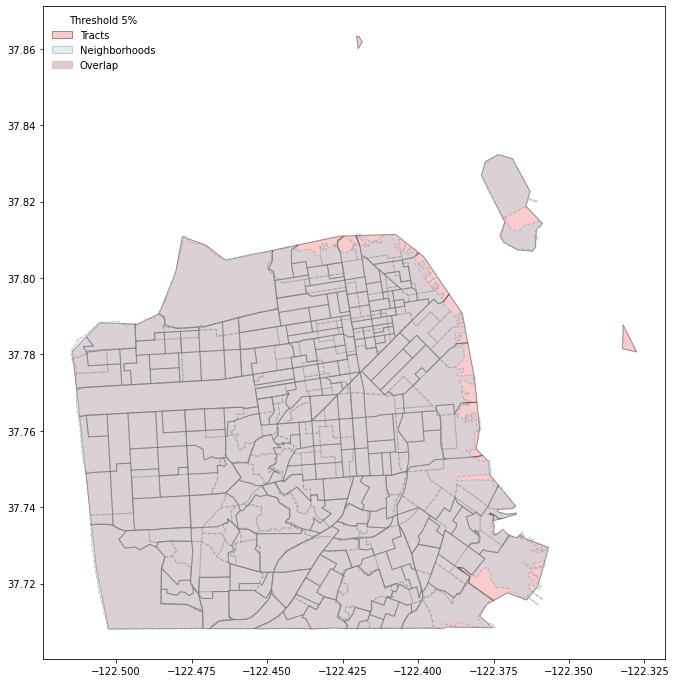

In [151]:
threshold_wrapper(city_list[13], city_results, threshold_list)

San Jose
Threshold: 0
    Neighborhoods before & after: 66/66
               Neighborhood Loss: 0
    Unique Tracts before & after: 396/396
              Total Tracts after: 929
                  Tract Multiple: 2.346
               Neighborhood Area: 335.6923
          Overlapping Tract Area: 335.692
          Overlapping Area Ratio: 1.0
        All Filtered Tracts Area: 883.5851
             Filtered Area Ratio: 2.6321
     Total (double-counted) Area: 3556.3496
            Dissolved Area Ratio: 10.5941
Threshold: 0.5
    Neighborhoods before & after: 66/66
               Neighborhood Loss: 0
    Unique Tracts before & after: 396/375
              Total Tracts after: 658
                  Tract Multiple: 1.7547
               Neighborhood Area: 335.6923
          Overlapping Tract Area: 334.9327
          Overlapping Area Ratio: 0.9977
        All Filtered Tracts Area: 337.2028
             Filtered Area Ratio: 1.0045
     Total (double-counted) Area: 2055.5286
            Dissolved 

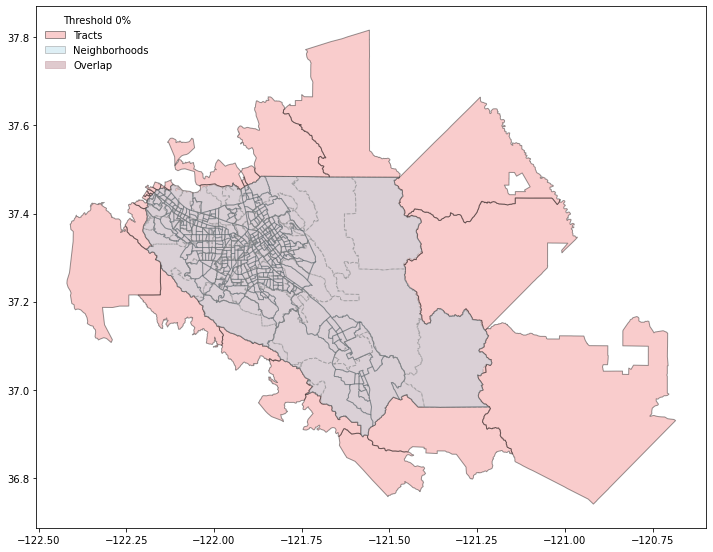

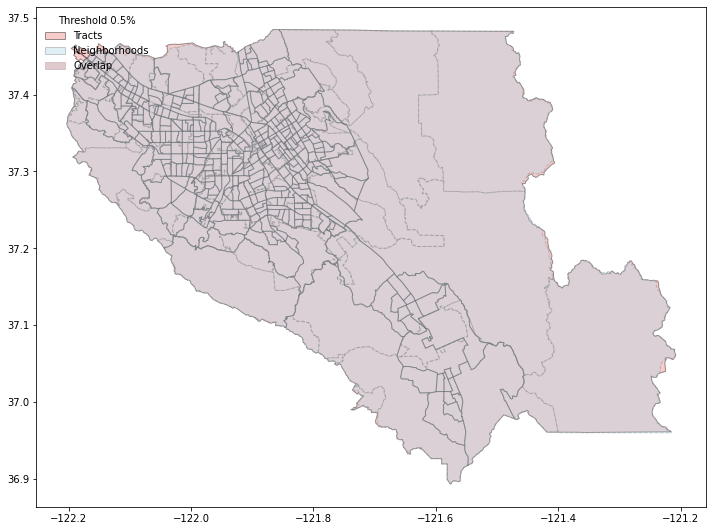

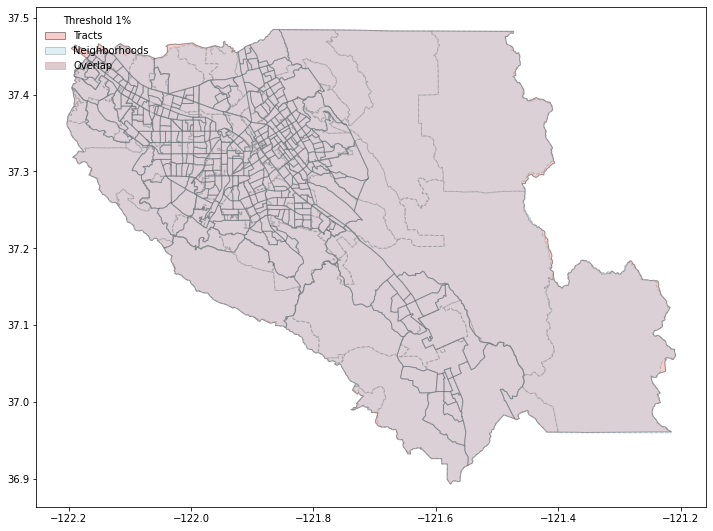

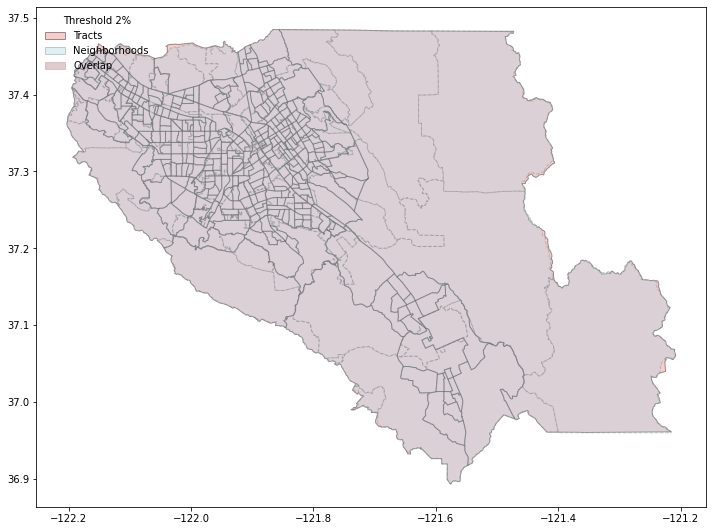

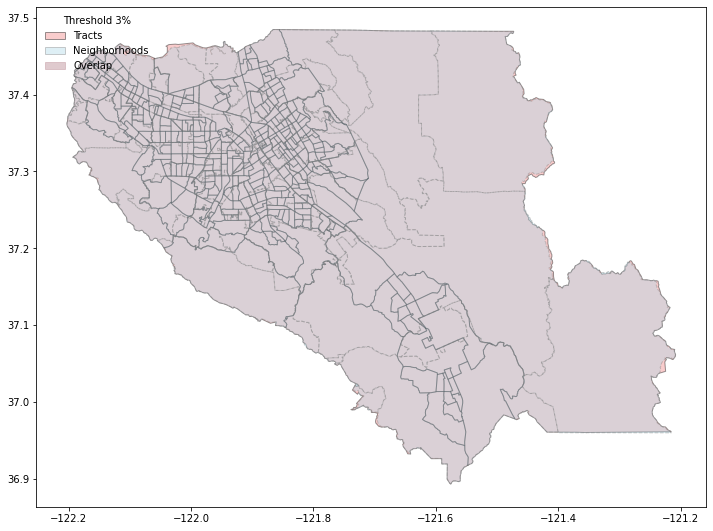

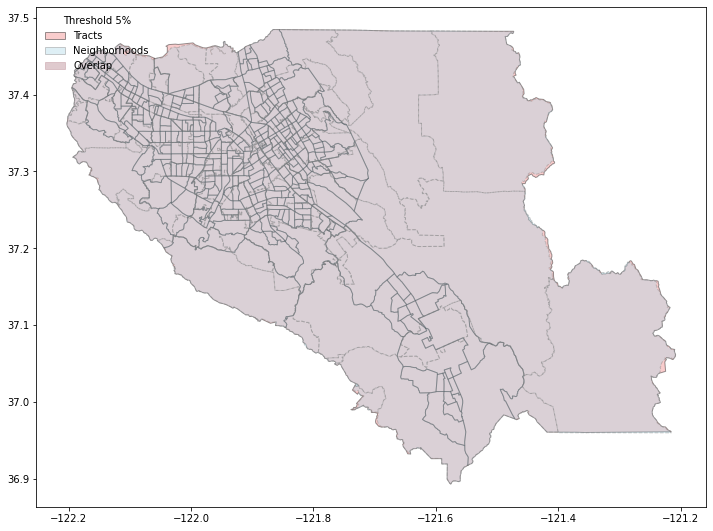

In [152]:
threshold_wrapper(city_list[14], city_results, threshold_list)

Seattle
Threshold: 0
    Neighborhoods before & after: 119/119
               Neighborhood Loss: 0
    Unique Tracts before & after: 142/142
              Total Tracts after: 541
                  Tract Multiple: 3.8099
               Neighborhood Area: 21.6612
          Overlapping Tract Area: 21.643
          Overlapping Area Ratio: 0.9992
        All Filtered Tracts Area: 29.0328
             Filtered Area Ratio: 1.3403
     Total (double-counted) Area: 123.3963
            Dissolved Area Ratio: 5.6967
Threshold: 0.5
    Neighborhoods before & after: 119/94
               Neighborhood Loss: 25
    Unique Tracts before & after: 142/135
              Total Tracts after: 320
                  Tract Multiple: 2.3704
               Neighborhood Area: 21.6612
          Overlapping Tract Area: 21.5957
          Overlapping Area Ratio: 0.997
        All Filtered Tracts Area: 26.8339
             Filtered Area Ratio: 1.2388
     Total (double-counted) Area: 69.7101
            Dissolved Area

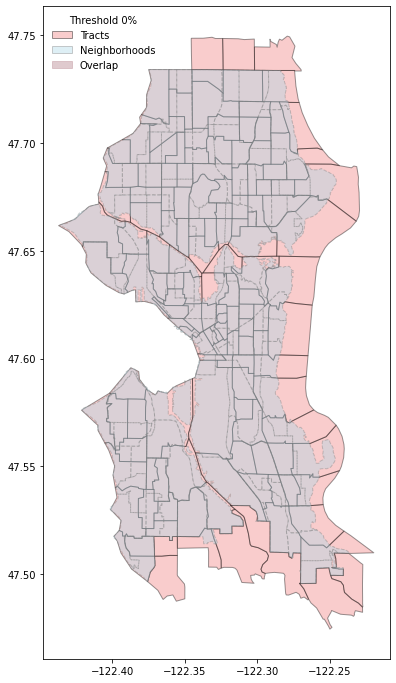

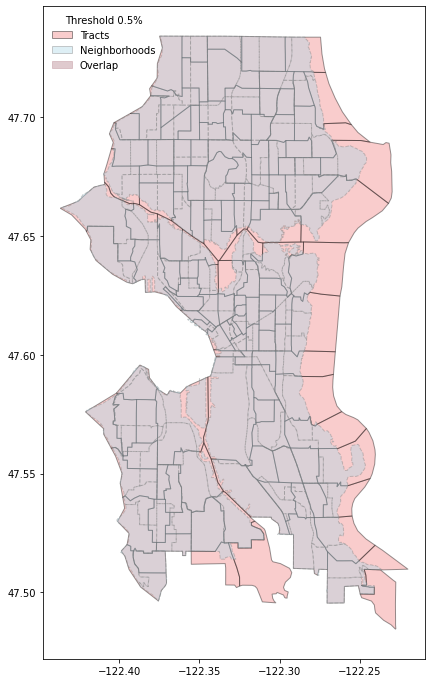

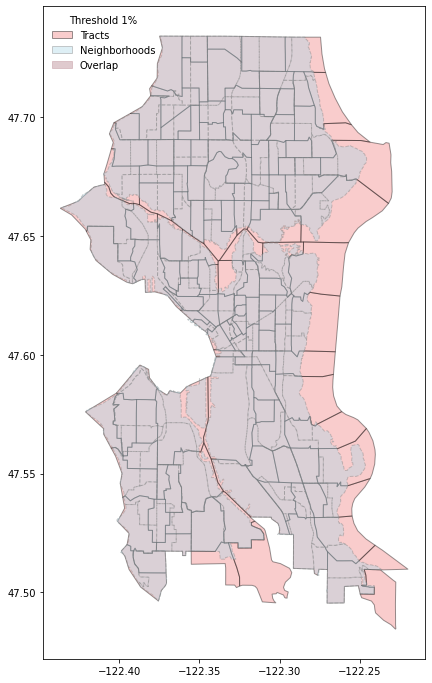

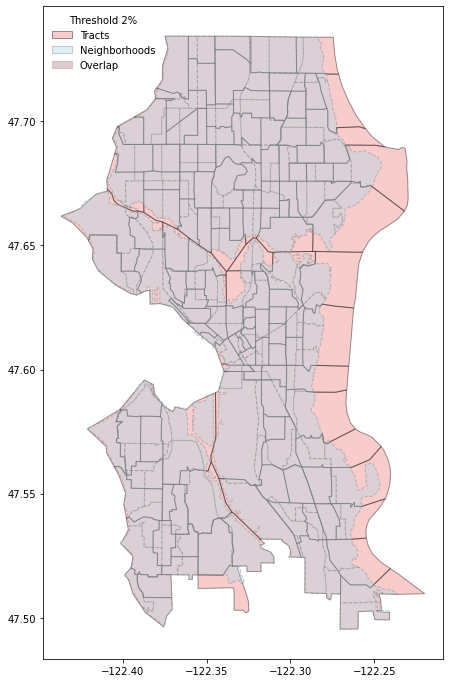

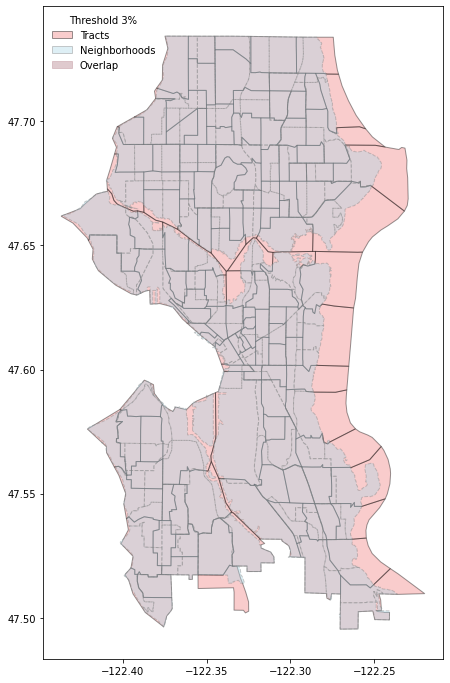

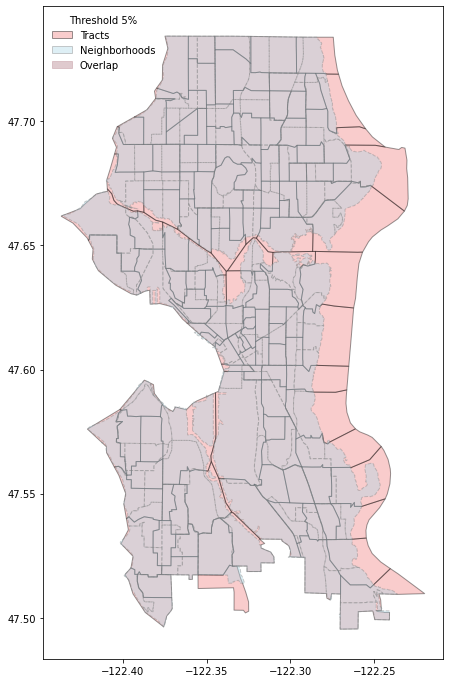

In [153]:
threshold_wrapper(city_list[15], city_results, threshold_list)

Washington DC
Threshold: 0
    Neighborhoods before & after: 46/46
               Neighborhood Loss: 0
    Unique Tracts before & after: 179/179
              Total Tracts after: 453
                  Tract Multiple: 2.5307
               Neighborhood Area: 17.7467
          Overlapping Tract Area: 17.6471
          Overlapping Area Ratio: 0.9944
        All Filtered Tracts Area: 17.693
             Filtered Area Ratio: 0.997
     Total (double-counted) Area: 58.2261
            Dissolved Area Ratio: 3.281
Threshold: 0.5
    Neighborhoods before & after: 46/46
               Neighborhood Loss: 0
    Unique Tracts before & after: 179/179
              Total Tracts after: 326
                  Tract Multiple: 1.8212
               Neighborhood Area: 17.7467
          Overlapping Tract Area: 17.6177
          Overlapping Area Ratio: 0.9927
        All Filtered Tracts Area: 17.693
             Filtered Area Ratio: 0.997
     Total (double-counted) Area: 40.2191
            Dissolved Area R

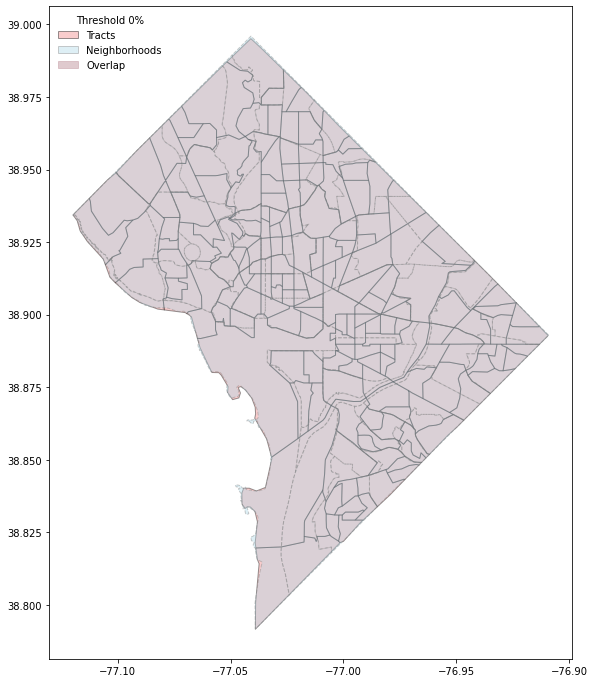

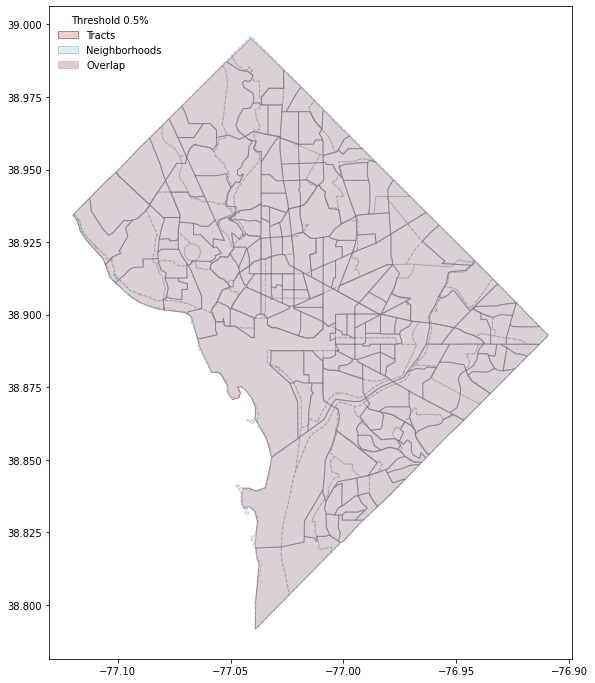

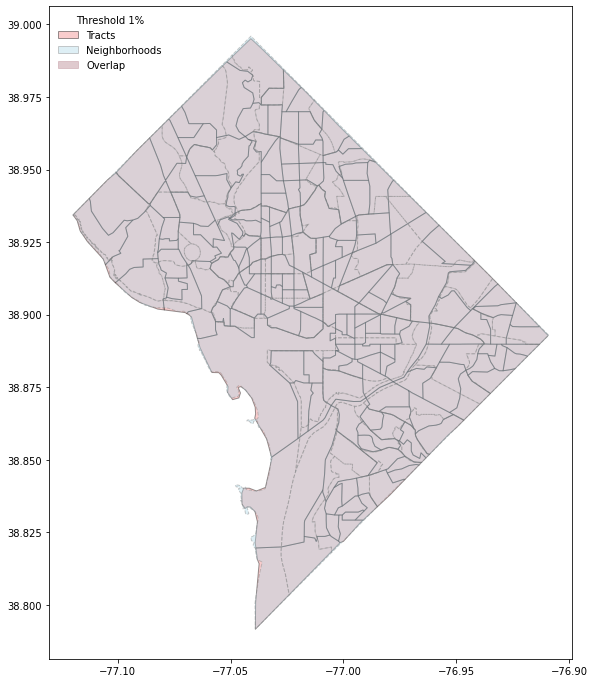

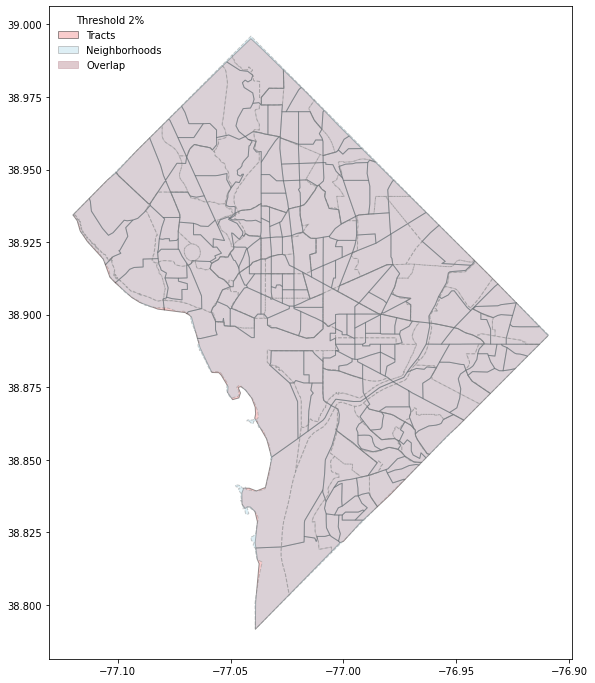

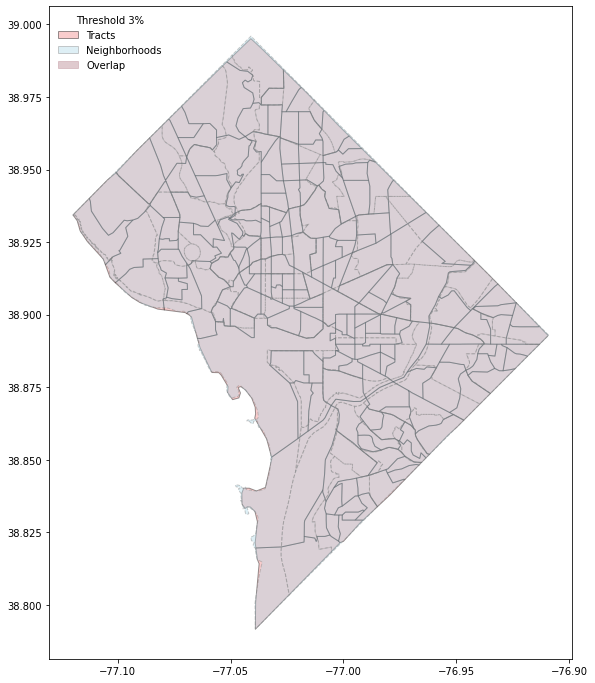

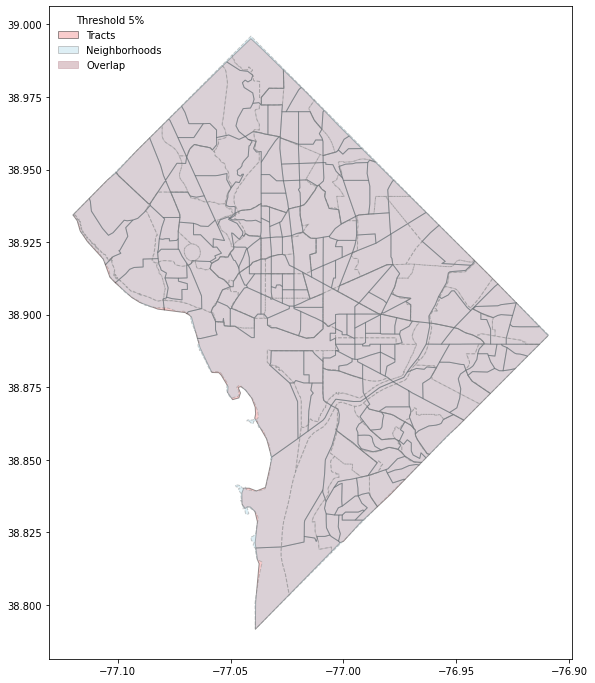

In [154]:
threshold_wrapper(city_list[16], city_results, threshold_list)

In [155]:
city_results

{'Key': ['Threshold', ('Lost Nbhd/Total', 'Tract Multiple', '% Area Loss')],
 'Austin': [[0, ('0/103', 3.31981981981982, -196.9895641193875)],
  [0.5, ('0/103', 1.9259259259259258, -113.59152750095944)],
  [1, ('0/103', 1.7289719626168225, -106.97557533517377)],
  [2, ('0/103', 1.568075117370892, -104.17868505428393)],
  [3, ('0/103', 1.5330188679245282, -103.62953242798253)],
  [5, ('0/103', 1.4688995215311005, -86.95762512534199)]],
 'Baltimore': [[0, ('0/278', 5.190476190476191, -51.7620213448694)],
  [0.5, ('0/278', 3.2657004830917873, -11.11834755532315)],
  [1, ('0/278', 3.044334975369458, -7.9941052031090365)],
  [2, ('1/278', 2.905, -6.3968054003945785)],
  [3, ('2/278', 2.8, -6.3968054003945785)],
  [5, ('9/278', 2.605, -6.3968054003945785)]],
 'Denver': [[0, ('0/78', 3.2216748768472905, -268.7551148725523)],
  [0.5, ('0/78', 1.2121212121212122, -16.67598155651808)],
  [1, ('0/78', 1.12987012987013, -7.83922832791073)],
  [2, ('0/78', 1.0410958904109588, -0.5192219405576903)],

In [38]:
remove_overlaps(losangeles, 'display_na', print_info=True)

    Row 1: Agua Dulce L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    6.304740566725906e-05 & 5.044481833563425e-05
    Row 2: Angeles Crest L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    2.9903942334889137e-06 & 3.2650695348402393e-05
    Row 3: Palmdale L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    4.140410362355431e-08 & 1.416862837468811e-07
    Row 4: Southeast Antelope Valley L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    1.655842241832841e-05 & 8.121088279597246e-05
    Row 5: Tujunga Canyons L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    2.006702688870726e-07 & 1.1712234404161342e-06
    Row 6: Acton L.A. County Neighborhood (Current) & Agua Dulce L.A. County Neighborhood (Current)
    5.0444818335634255e-05 & 6.304740566725907e-05
    Row 8: Palmdale L.A. County Neighborhood (Current) & Agua Dulce L.A. Co

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -118.085710676454 34.419890137153253 (-118.08571067645399921 34.419890137153252851)
<A>
GEOMETRYCOLLECTION (LINESTRING (-117.8898459999999915 34.1651209991226494, -117.8898520000002037 34.1614899991226721), LINESTRING (-118.1178719243801112 34.4806809849069253, -118.1178660269384295 34.4807119909937754), POLYGON ((-118.0795859088922413 34.4701407283688042, -118.0449262930528391 34.4703381370782083, -118.0111199299880695 34.4701377083992355, -118.0111063607413655 34.4427025729470344, -118.0105330000000095 34.4431629991194157, -118.0097650000000016 34.4433069991194571, -118.0085169999999977 34.4410989991194540, -118.0074290000000019 34.4404429991195045, -118.0071410000000043 34.4396429991194495, -118.0064210000000031 34.4390669991194542, -118.0049970000000030 34.4386029991194818, -118.0046450000000107 34.4382509991194894, -118.0043409999999966 34.4383309991195858, -118.0034930000000060 34.438074999119

    Row 24: Acton L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    1.416862837474264e-07 & 4.1404103623713665e-08
    Row 25: Agua Dulce L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    3.1683619152656858e-21 & 7.407978334390726e-22
    Row 26: Castaic Canyons L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    3.122372369073641e-24 & 4.473659218174421e-24
    Row 27: Desert View Highlands L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    0.00010686123432894766 & 3.511343256652573e-07
Overlap in Desert View Highlands L.A. County Neighborhood (Current) and Palmdale L.A. County Neighborhood (Current): larger than 0.01%
    Row 28: Lancaster L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    1.9288517912917105e-06 & 1.4708879544480483e-06
    Row 29: Leona Valley L.A. County Neighborhood (Current) & Palmdale L.A. Coun

    Row 71: Exposition Park L.A. County Neighborhood (Current) & Jefferson Park L.A. County Neighborhood (Current)
    0.0006569215168797598 & 0.0008573287082975916
Overlap in Exposition Park L.A. County Neighborhood (Current) and Jefferson Park L.A. County Neighborhood (Current): larger than 0.01%
    Row 73: West Adams L.A. County Neighborhood (Current) & Jefferson Park L.A. County Neighborhood (Current)
    5.335392212245576e-05 & 5.5728064501435015e-05
    Row 74: Koreatown L.A. County Neighborhood (Current) & Pico-Union L.A. County Neighborhood (Current)
    0.00027785849685565793 & 0.00044992111169014904
Overlap in Koreatown L.A. County Neighborhood (Current) and Pico-Union L.A. County Neighborhood (Current): larger than 0.01%
    Row 75: Downtown L.A. County Neighborhood (Current) & Pico-Union L.A. County Neighborhood (Current)
    0.00011361825873207074 & 0.0003968597542567632
Overlap in Downtown L.A. County Neighborhood (Current) and Pico-Union L.A. County Neighborhood (Curren

    Row 119: Alhambra L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    9.486781872442379e-05 & 9.452679920636665e-05
    Row 120: East Los Angeles L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    4.86166156618519e-13 & 4.738160125023223e-13
    Row 121: El Sereno L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    4.305594396561522e-05 & 2.3431686032038692e-05
    Row 123: San Gabriel L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    1.1851531900426882e-05 & 6.445921920444833e-06
    Row 124: South San Gabriel L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    2.692040525853616e-12 & 4.981791776486747e-13
    Row 125: Alhambra L.A. County Neighborhood (Current) & San Gabriel L.A. County Neighborhood (Current)
    6.493694933578493e-05 & 0.00011896449590846583
Overlap in Alhambra L.A. County

    Row 166: Alondra Park L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.0011243818470909935 & 6.225755550466424e-05
Overlap in Alondra Park L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%
    Row 167: Gardena L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.000576630187426656 & 0.00016379676187137018
Overlap in Gardena L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%
    Row 168: Harbor City L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    4.8052915518755364e-05 & 6.013645106426848e-06
    Row 169: Harbor Gateway L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.00018582609382517877 & 4.646897085768905e-05
Overlap in Harbor Gateway L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -118.16566404327224 34.208053233742092 (-118.16566404327224404 34.208053233742091948)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.0942547553516135 34.1352155807105646, -118.0942879808104351 34.1352159996708053), LINESTRING (-118.1102276038138541 34.1373069991229983, -118.1101610000003177 34.1368079991230289), POLYGON ((-118.1869149999999848 34.2375079991217532, -118.1867170000000016 34.2343049991218535, -118.1864029999999985 34.2335659991217653, -118.1868410000001006 34.2321519991218750, -118.1866640000001496 34.2230209991220562, -118.1834820000001116 34.2231079991219431, -118.1834340000000196 34.2224039991219584, -118.1776740000001240 34.2224519991220362, -118.1775503100035536 34.2200896197547095, -118.1775749783614771 34.2200910027032421, -118.1773049792892749 34.2154040005952425, -118.1773049792892039 34.2154040005952353, -118.1773049792892039 34.2154040005951927, -118.1744019855798342 34.2150880037

    Row 187: Arcadia L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    3.864672335644704e-05 & 1.7133932938349177e-05
    Row 188: Eagle Rock L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.1080044325904742e-05 & 1.8727133932192709e-06
    Row 189: East Pasadena L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.119520864063414e-11 & 5.814958225375624e-13
    Row 190: Glendale L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.1168482933517408e-06 & 1.3597321149934867e-06
    Row 191: Highland Park L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    8.738554891758152e-05 & 1.1851817908640281e-05
    Row 192: La Canada Flintridge L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    2.527654296684525e-05 & 8.659334456497797e-06
    Row 194: San Marino L.A. County Neighborhood (Cur

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -117.77585910072403 34.148028109457272 (-117.77585910072403408 34.148028109457271739)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.1178719243801112 34.4806809849069253, -118.1178660269384295 34.4807119909937754), POLYGON ((-118.0795859088922413 34.4701407283688042, -118.0449262930528391 34.4703381370782083, -118.0111199299880695 34.4701377083992355, -118.0111063607413655 34.4427025729470344, -118.0105330000000095 34.4431629991194157, -118.0097650000000016 34.4433069991194571, -118.0085169999999977 34.4410989991194540, -118.0074290000000019 34.4404429991195045, -118.0071410000000043 34.4396429991194495, -118.0064210000000031 34.4390669991194542, -118.0049970000000030 34.4386029991194818, -118.0046450000000107 34.4382509991194894, -118.0043409999999966 34.4383309991195858, -118.0034930000000060 34.4380749991195216, -118.0029490000000010 34.4376429991195465, -118.0020530000000178 34.4372589991194857, -118.

    Row 221: Pomona L.A. County Neighborhood (Current) & La Verne L.A. County Neighborhood (Current)
    1.918801086751647e-06 & 5.1256034455408e-06
    Row 222: San Dimas L.A. County Neighborhood (Current) & La Verne L.A. County Neighborhood (Current)
    1.0133487642843356e-05 & 1.846979620152077e-05
    Row 223: Angeles Crest L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    4.2570269381444323e-07 & 1.317745084270586e-05
    Row 224: Arcadia L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    2.911526162009337e-06 & 2.3306674235871286e-06
    Row 225: Bradbury L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    1.722640996721385e-06 & 2.3870703660240045e-07
    Row 226: Duarte L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    0.000190171307409796 & 9.133221631928301e-05
Overlap in Duarte L.A. County Neighborhood (Current) and Monrovia L.A. County Ne

CBR: result (after common-bits addition) is INVALID: Too few points in geometry component at or near point -118.073391999202 34.147765024698543 (-118.07339199920200201 34.147765024698543357)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.1102066150306769 34.1371497498267686, -118.1101610000000051 34.1368079991230005), LINESTRING (-118.1659049718369943 34.2103040059890020, -118.1666013129370043 34.2106909333350018), LINESTRING (-118.1634449718369950 34.1997130059749992, -118.1620869876220041 34.1992767755600013), POLYGON ((-118.1869149999999991 34.2375079991220019, -118.1867170000000016 34.2343049991220028, -118.1864029999999985 34.2335659991219998, -118.1868410000000011 34.2321519991220029, -118.1866639999999933 34.2230209991219994, -118.1834819999999979 34.2231079991220000, -118.1834340000000054 34.2224039991220010, -118.1776739999999961 34.2224519991220006, -118.1775503100039941 34.2200896197550009, -118.1775749783609939 34.2200910027030005, -118.1773049792890049 34.2154040005950009, -118.

    Row 258: East Pasadena L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    0.00047073649011073387 & 0.0002815197030233871
Overlap in East Pasadena L.A. County Neighborhood (Current) and East San Gabriel L.A. County Neighborhood (Current): larger than 0.01%
    Row 260: Rosemead L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    3.6631123686086894e-05 & 8.636699815506336e-05
    Row 261: San Gabriel L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    7.246032279248695e-05 & 0.00013801711328145452
Overlap in San Gabriel L.A. County Neighborhood (Current) and East San Gabriel L.A. County Neighborhood (Current): larger than 0.01%
    Row 262: San Marino L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    0.0003438493899373903 & 0.000595642034779476
Overlap in San Marino L.A. County Neighborhood (Current) and East San Gabrie

    Row 308: Mission Hills L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    1.9977875513150417e-05 & 8.912254558715399e-06
    Row 310: San Fernando L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    9.428028490798779e-07 & 3.15257502484082e-07
    Row 311: Sylmar L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    3.3167000843726414e-06 & 5.797978839739589e-06
    Row 313: Sun Valley L.A. County Neighborhood (Current) & Panorama City L.A. County Neighborhood (Current)
    2.347097906811022e-06 & 6.069722588505333e-06
    Row 314: Burbank L.A. County Neighborhood (Current) & Sun Valley L.A. County Neighborhood (Current)
    5.2891148630128406e-05 & 9.732891790406476e-05
    Row 315: North Hollywood L.A. County Neighborhood (Current) & Sun Valley L.A. County Neighborhood (Current)
    3.109512503427289e-05 & 1.936401280625345e-05
    Row 316: Panorama City L.A. County Neighborhood (Curren

    Row 359: Harbor Gateway L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    0.0003391487597876481 & 0.0010608900989469926
Overlap in Harbor Gateway L.A. County Neighborhood (Current) and Vermont Vista L.A. County Neighborhood (Current): larger than 0.01%
    Row 360: Vermont Knolls L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    6.316220643141776e-07 & 4.4099772088494173e-07
    Row 361: Westmont L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    0.0010016592133884233 & 0.0011268281049680543
Overlap in Westmont L.A. County Neighborhood (Current) and Vermont Vista L.A. County Neighborhood (Current): larger than 0.01%
    Row 362: Athens L.A. County Neighborhood (Current) & Harbor Gateway L.A. County Neighborhood (Current)
    0.00040659953145552076 & 0.000105559808078517
Overlap in Athens L.A. County Neighborhood (Current) and Harbor Gateway L.A. County Neighborhood

    Row 401: Eagle Rock L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    6.325960084338993e-05 & 8.78207407038791e-06
    Row 402: Glassell Park L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.9390731118989546e-05 & 2.6417427437477257e-06
    Row 404: Griffith Park L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.2034058195338125e-05 & 4.198164884816114e-06
    Row 405: La Crescenta-Montrose L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.1674506704892166e-06 & 2.4263411020723935e-07
    Row 406: Pasadena L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    1.3597321149934867e-06 & 1.1168482933517408e-06
    Row 407: Shadow Hills L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    1.535273068911999e-05 & 6.4276465583174804e-06
    Row 408: Tujunga Canyons L.A. County Neigh

    Row 456: Azusa L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    4.0842190722417066e-05 & 0.0003988033923440399
Overlap in Azusa L.A. County Neighborhood (Current) and Citrus L.A. County Neighborhood (Current): larger than 0.01%
    Row 458: Covina L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    7.999972326897032e-14 & 6.004826357787716e-13
    Row 459: Glendora L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    7.094309959581793e-06 & 0.00013700911377445785
Overlap in Glendora L.A. County Neighborhood (Current) and Citrus L.A. County Neighborhood (Current): larger than 0.01%
    Row 460: Azusa L.A. County Neighborhood (Current) & Vincent L.A. County Neighborhood (Current)
    6.522569133727409e-07 & 4.3610066382102725e-06
    Row 461: Covina L.A. County Neighborhood (Current) & Vincent L.A. County Neighborhood (Current)
    1.5723514965393927e-07 & 8.081274315590115e-07
    Row 462:

    Row 496: Vermont Vista L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    4.409977208849417e-07 & 6.316220643141776e-07
    Row 497: Gramercy Park L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    2.2331472779690346e-06 & 2.2158672805785232e-06
    Row 498: Manchester Square L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    8.041846743775865e-05 & 7.07244532336119e-05
    Row 500: Westmont L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    0.000965140822967588 & 0.0015550677459753024
Overlap in Westmont L.A. County Neighborhood (Current) and Vermont Knolls L.A. County Neighborhood (Current): larger than 0.01%
    Row 502: Culver City L.A. County Neighborhood (Current) & Baldwin Hills/Crenshaw L.A. County Neighborhood (Current)
    1.705583317206205e-06 & 3.069675004568385e-06
    Row 503: Ladera Heights L.A. County Neighbo

    Row 543: Ramona L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    2.6415471424275825e-12 & 5.922742040714482e-13
    Row 544: South San Jose Hills L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    5.885839575807774e-12 & 5.416004373390427e-13
    Row 545: Valinda L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    5.88121496233567e-06 & 7.309383491895729e-07
    Row 546: Vincent L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    3.1194659900853756e-12 & 2.862067877046932e-13
    Row 547: Walnut L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    0.00014826332721684313 & 8.284008112682268e-05
Overlap in Walnut L.A. County Neighborhood (Current) and West Covina L.A. County Neighborhood (Current): larger than 0.01%
    Row 549: West Puente Valley L.A. County Neighborhood (Current) & West Covina L.A. Cou

Input geom 0 is INVALID: Self-intersection at or near point -118.16418000000017 33.827684999126781 (-118.1641800000001723 33.827684999126780951)
<A>
MULTIPOLYGON (((-118.1641800000001723 33.8276849991267810, -118.1610660000002042 33.8275769991267836, -118.1577880000000107 33.8250399991267443, -118.1557940000001423 33.8250319991268142, -118.1559960000002576 33.8275639991267525, -118.1541030000001484 33.8275519991267117, -118.1542010000001710 33.8288159991267747, -118.1520480000002209 33.8287549991268435, -118.1507030000002203 33.8294819991267062, -118.1495010000001429 33.8323759991266968, -118.1425440000000151 33.8323539991267239, -118.1424850000001072 33.8466939991265221, -118.1337880000001519 33.8466669991264695, -118.1321180000002187 33.8465169991266066, -118.1322990000002733 33.8470779991265616, -118.1250750000001801 33.8470549991265557, -118.1251450000001739 33.8322759991267219, -118.0974080000001720 33.8321839991267339, -118.0944410000001596 33.8318489991266134, -118.0933380000001

    Row 587: Lakewood L.A. County Neighborhood (Current) & Bellflower L.A. County Neighborhood (Current)
    9.271647498338921e-05 & 0.000142446939509722
Overlap in Lakewood L.A. County Neighborhood (Current) and Bellflower L.A. County Neighborhood (Current): larger than 0.01%
    Row 588: Long Beach L.A. County Neighborhood (Current) & Bellflower L.A. County Neighborhood (Current)
    4.108291765384234e-06 & 3.464841312039782e-05


9988229159, -118.1922990231073811 33.7596139943778297, -118.1925099975610323 33.7597749873523938, -118.1941079843625744 33.7595840054904883, -118.1958830108240477 33.7597899817960183, -118.1974500091087776 33.7603309918471766, -118.1994679981704337 33.7613209934158860, -118.1989179914529586 33.7623269890579039, -118.1989259884895063 33.7632470165559795, -118.2006740249524910 33.7632770054434133, -118.2008190238536542 33.7631729913548781, -118.2006639760445523 33.7620739775499104, -118.2000559908117339 33.7615720056646111, -118.2005159782545860 33.7617369971573780, -118.2015240257678528 33.7617619878968611, -118.2023319895289575 33.7613910200984932, -118.2024190099144931 33.7611869904400166, -118.2024420013947008 33.7604070163073189, -118.2016339850217008 33.7593769769433010, -118.2018100250519836 33.7591879943406568, -118.2016539776133754 33.7589660239618112, -118.2011879923927467 33.7591540069349278, -118.1978900039602536 33.7571740037973740, -118.1978480195178349 33.7560819873994689,

TopologicalError: The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.multipolygon.MultiPolygon object at 0x7fe575c9d400>

In [41]:
austin_overlay = city_list[0][0].overlay(city_list[0][0])
filtered_austin_overlay = austin_overlay[austin_overlay['neighname_1'] != austin_overlay['neighname_2']]
filtered_austin_overlay

,fid_1,target_fid_1,neighname_1,sqmiles_1,shape_leng_1,shape_area_1,shape_le_2_1,fid_2,target_fid_2,neighname_2,sqmiles_2,shape_leng_2,shape_area_2,shape_le_2_2,geometry
4,69.0,69.0,ROBINSON RANCH,10.777298,139682.703937,3.004538e+08,139682.703937,48.0,48.0,MCNEIL,7.087357,89033.685935,1.975842e+08,89033.685935,"MULTIPOLYGON (((-97.72852 30.43270, -97.72830 ..."
45,6.0,6.0,BARTON HILLS,3.188974,48357.389794,8.890350e+07,48357.389794,76.0,76.0,SOUTH LAMAR,1.213967,24988.697161,3.384344e+07,24988.697161,"POLYGON ((-97.79505 30.23473, -97.79391 30.235..."
49,94.0,94.0,WINDSOR HILLS,1.244682,24789.653502,3.469975e+07,24789.653502,84.0,84.0,TECH RIDGE,6.812974,128967.182537,1.899348e+08,128967.182537,"POLYGON ((-97.67356 30.37605, -97.67171 30.375..."
53,84.0,84.0,TECH RIDGE,6.812974,128967.182537,1.899348e+08,128967.182537,94.0,94.0,WINDSOR HILLS,1.244682,24789.653502,3.469975e+07,24789.653502,"POLYGON ((-97.67356 30.37605, -97.67171 30.375..."
66,14.0,14.0,VILLAGE AT WESTERN OAKS,2.820512,52746.580979,7.863136e+07,52746.580979,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,"MULTIPOLYGON (((-97.87770 30.19691, -97.87757 ..."
67,75.0,75.0,SOUTH BRODIE,4.801036,134565.923260,1.338452e+08,134565.923260,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,"MULTIPOLYGON (((-97.87593 30.18678, -97.87604 ..."
69,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,14.0,14.0,VILLAGE AT WESTERN OAKS,2.820512,52746.580979,7.863136e+07,52746.580979,"MULTIPOLYGON (((-97.87757 30.19701, -97.87770 ..."
71,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,75.0,75.0,SOUTH BRODIE,4.801036,134565.923260,1.338452e+08,134565.923260,"MULTIPOLYGON (((-97.87604 30.18709, -97.87593 ..."
74,76.0,76.0,SOUTH LAMAR,1.213967,24988.697161,3.384344e+07,24988.697161,6.0,6.0,BARTON HILLS,3.188974,48357.389794,8.890350e+07,48357.389794,"POLYGON ((-97.79505 30.23473, -97.79391 30.235..."
92,48.0,48.0,MCNEIL,7.087357,89033.685935,1.975842e+08,89033.685935,69.0,69.0,ROBINSON RANCH,10.777298,139682.703937,3.004538e+08,139682.703937,"MULTIPOLYGON (((-97.72830 30.43258, -97.72852 ..."


Threshold:  0.01
Unique neighborhoods before: 119
       Unique tracts before: 142
          Neighborhood area: 21.6612
 Unique neighborhoods after: 108
        Unique tracts after: 140
         Total tracts after: 460
              Filtered area: 21.6424
                  Area loss: 0.0868
                 Tract loss: 2
          Neighborhood loss: 11
Missing neighborhoods:  [  2   7  10  11  13  14  18  19  20  28 110] 



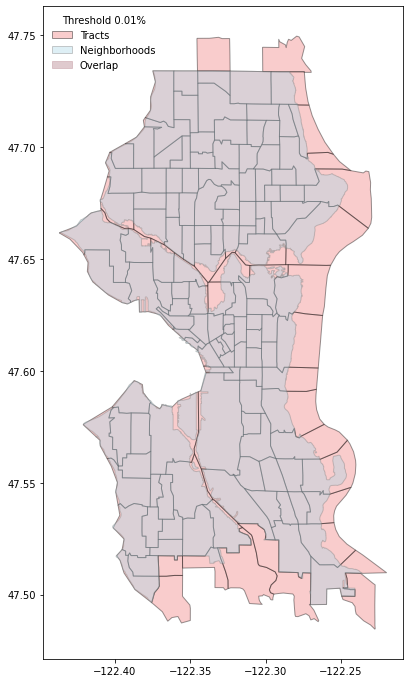

In [45]:
temp = thresholds(city_list[15][0], city_list[15][2], [.01], state=city_list[15][3])

What follows is a small experiment to make sure I understood how the gpd functions were working. I left it in in case future readers are also confused. In particular, I wanted to check that it would not count two bordering polygons as intersecting, which means that any intersection from the cities must in fact have an overlap. That overlap might be extremely small, but it still exists.

In [84]:
test_city_rect = gpd.GeoSeries([Polygon([(0.5, 0), (0.5, 1), (1.5, 1), (1.5, 0)])], ['City'])
test_over_rect = gpd.GeoSeries([Polygon([(0, 0), (0, 1), (1, 1), (1, 0)]),
                           Polygon([(1, 0), (1, 1), (2, 1), (2, 0)]),
                           Polygon([(0.75, 0), (0.75, 1), (1.25, 1), (1.25, 0)])])
test_city = gpd.GeoDataFrame({'geometry': test_city_rect})
test_over = gpd.GeoDataFrame({'geometry': test_over_rect, 'name': ['Left', 'Right', 'Inner']})

<AxesSubplot:>

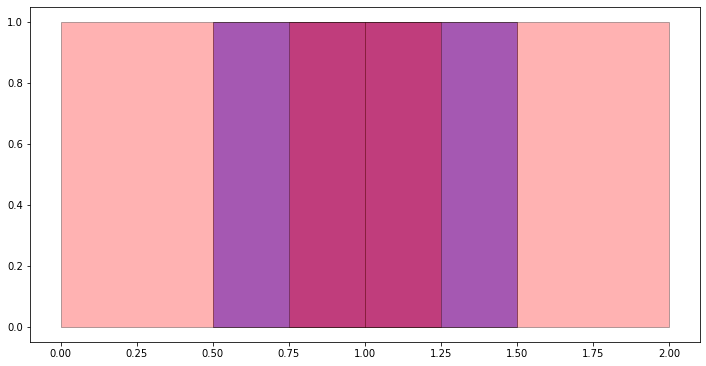

In [59]:
f, ax = plt.subplots(figsize=(12, 12))
test_city.plot(ax=ax, alpha=.5, color='blue', edgecolor='k')
test_over.plot(ax=ax, alpha=.3, color='red', edgecolor='k')

In [85]:
test_intersect = gpd.sjoin(test_over, test_city, how="inner", op="intersects")
test_intersect

,geometry,name,index_right
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",Left,City
1,"POLYGON ((1.00000 0.00000, 1.00000 1.00000, 2....",Right,City
2,"POLYGON ((0.75000 0.00000, 0.75000 1.00000, 1....",Inner,City


<AxesSubplot:>

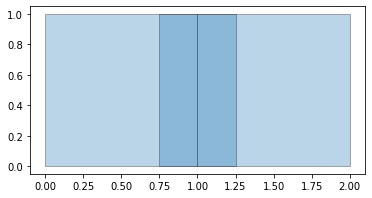

In [73]:
test_intersect.plot(alpha=.3, edgecolor='k')

In [86]:
test_overlay = test_over.overlay(test_city)
test_overlay['over_area'] = test_overlay.area
test_overlay

,name,geometry,over_area
0,Left,"POLYGON ((1.00000 1.00000, 1.00000 0.00000, 0....",0.5
1,Right,"POLYGON ((1.00000 1.00000, 1.50000 1.00000, 1....",0.5
2,Inner,"POLYGON ((0.75000 1.00000, 1.25000 1.00000, 1....",0.5


In [94]:
test_intersect2 = test_intersect.merge(test_overlay[['name', 'over_area']])
test_intersect2

,geometry,name,index_right,over_area
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",Left,City,0.5
1,"POLYGON ((1.00000 0.00000, 1.00000 1.00000, 2....",Right,City,0.5
2,"POLYGON ((0.75000 0.00000, 0.75000 1.00000, 1....",Inner,City,0.5


In [119]:
print('nbhd area', test_city.area.array[0])
print('filtered area', test_intersect2.dissolve().area.array[0])
print('overlapping area', np.sum(test_intersect2.over_area))
print('total area', np.sum(test_intersect2.area))

nbhd area 1.0
filtered area 2.0
overlapping area 1.5
total area 2.5
